In [57]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# machine learning dependencies
# scaling of data
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
# train/test split
from sklearn.model_selection import train_test_split
# model selection
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
# the KRR model
from sklearn.kernel_ridge import KernelRidge
# linear model
from sklearn.linear_model import LinearRegression, SGDRegressor
# pipeline to streamline modeling pipelines
from sklearn.pipeline import Pipeline
# principal component analysis
from sklearn.decomposition import PCA
# polynomial kernel
from sklearn.metrics.pairwise import polynomial_kernel
# Dummy model as baseline
from sklearn.dummy import DummyClassifier, DummyRegressor
# Variance Threshold for feature selection
from sklearn.feature_selection import VarianceThreshold, SelectKBest, f_regression
# metrics to measure model performance
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                             mean_absolute_error, mean_squared_error, max_error, mean_absolute_percentage_error)
from sklearn.metrics import r2_score


import xgboost as xgb
import shap

# save/load models
import joblib

# For the permutation importance implementation
from sklearn.metrics import check_scoring
from sklearn.utils import Bunch
from sklearn.utils import check_random_state
from sklearn.utils import check_array


In [58]:
#If running on Colab, uncomment
#!pip install rdkit

In [59]:
# Load the pre-processed data
df_with_descriptors = pd.read_pickle('../../data/processed data/processed_data.pkl')
cc_with_descriptors = pd.read_pickle('../../data/processed data/processed_neurips_test.pkl')

In [60]:
df_with_descriptors.shape

(7973, 20)

In [61]:
df_with_descriptors.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7973 entries, 0 to 7972
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                7973 non-null   int64  
 1   SMILES            7973 non-null   object 
 2   Tg                511 non-null    float64
 3   FFV               7030 non-null   float64
 4   Tc                737 non-null    float64
 5   Density           613 non-null    float64
 6   Rg                614 non-null    float64
 7   canonical_smiles  7973 non-null   object 
 8   molecule          7973 non-null   object 
 9   MW                7973 non-null   float64
 10  LogP              7973 non-null   float64
 11  TPSA              7973 non-null   float64
 12  HBD               7973 non-null   int64  
 13  HBA               7973 non-null   int64  
 14  RotBonds          7973 non-null   int64  
 15  NumHeavyAtoms     7973 non-null   int64  
 16  NumHeteroatoms    7973 non-null   int64  


In [62]:
RANDOM_SEED = 101
np.random.seed(RANDOM_SEED)

Defining Feature and Target Columns

In [63]:
#Comment out non-utilized features
TARGET_COLS = 'Tc'
FEATURES_COLS = (
    #'FFV', 
    'Density',
    'Rg',
    #'Tg', 
    'MW',
    'LogP',
    'TPSA',
    'HBD',
    'HBA',
    'RotBonds',
    'NumHeavyAtoms',
    'NumHeteroatoms',
    'RingCount',
    'NumAromaticRings',
    'FractionCSP3',
    # 'canonical_smiles', # Note: This is a string representation, often needs further featurization (e.g., fingerprints)
    # 'molecule'          # Note: This is an RDKit Mol object, needs conversion to numerical features
)

print(f"Target Columns: {TARGET_COLS}")
print(f"Feature Columns: {FEATURES_COLS}")


Target Columns: Tc
Feature Columns: ('Density', 'Rg', 'MW', 'LogP', 'TPSA', 'HBD', 'HBA', 'RotBonds', 'NumHeavyAtoms', 'NumHeteroatoms', 'RingCount', 'NumAromaticRings', 'FractionCSP3')


Further Data Processing: duplicate removal, removing rows with NaNs -> Ensures remaining rows have complete data

In [64]:
df_with_descriptors = df_with_descriptors.drop_duplicates()

df_with_descriptors = df_with_descriptors.dropna(subset=list(FEATURES_COLS) + [TARGET_COLS])

print(f"Number of rows after removing rows with NaN values: {df_with_descriptors.shape[0]}")

Number of rows after removing rows with NaN values: 531


In [65]:
cc_with_descriptors = cc_with_descriptors.drop_duplicates()

cc_with_descriptors = cc_with_descriptors.dropna(subset=list(FEATURES_COLS) + [TARGET_COLS])

print(f"Number of rows after removing rows with NaN values: {cc_with_descriptors.shape[0]}")

Number of rows after removing rows with NaN values: 3


Target Feature Distribution

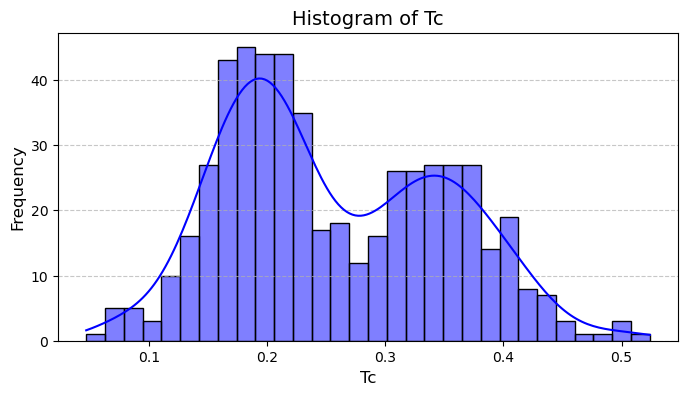

In [66]:
# Plot histogram of the target
plt.figure(figsize=(8, 4))
sns.histplot(df_with_descriptors[TARGET_COLS], kde=True, bins=30, color='blue')

plt.xlabel(f"{TARGET_COLS}", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title(f"Histogram of {TARGET_COLS}", fontsize=14)

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Stratified Data Splitting: Assign High-performing vs Low-performing polymer classes

In [67]:
TARGET_BINARY = "target_binned" 
THRESHOLD = 0.3  

#Assign class labels based on threshold
df_with_descriptors[TARGET_BINARY] = (df_with_descriptors[TARGET_COLS] > THRESHOLD).astype(int)

In [68]:
#View class distribution
print("Class distribution for stratification:")
print(df_with_descriptors[TARGET_BINARY].value_counts())

Class distribution for stratification:
target_binned
0    341
1    190
Name: count, dtype: int64


190 out of 531 samples are high-performing in Tc.

In [69]:
df_train, df_test = train_test_split(
    df_with_descriptors, 
    train_size=0.8,
    test_size=0.2,
    random_state=RANDOM_SEED,
    stratify=df_with_descriptors[TARGET_BINARY] # Stratify using the binary target from cleaned df
)

print(f"df_train shape: {df_train.shape}")
print(f"df_test shape: {df_test.shape}")

df_train shape: (424, 21)
df_test shape: (107, 21)


Find Low-Variance Features

In [70]:
variances = df_train[list(FEATURES_COLS)].var() 

# We use a small tolerance for floating-point comparison
redundant_features = variances[variances < 1e-9].index.tolist()

print(f"Features with zero or near-zero variance: {redundant_features}")

print(f"Number of features before: {len(FEATURES_COLS)}")
FEATURES_COLS = [feature for feature in FEATURES_COLS if not feature in redundant_features]
print(f"Number of features after: {len(FEATURES_COLS)}")

Features with zero or near-zero variance: []
Number of features before: 13
Number of features after: 13


Regression Metrics

In [71]:
def get_regression_metrics(model, X, y_true):
    """
    Get a dicionary with regression metrics:

    model: sklearn model with predict method
    X: feature matrix
    y_true: ground truth labels
    """
    # Get predictions from the model using the provided features X
    y_predicted = model.predict(X)

    # Calculate the regression metrics using sklearn.metrics functions
    mae = mean_absolute_error(y_true, y_predicted)
    mse = mean_squared_error(y_true, y_predicted)
    maximum_error = max_error(y_true, y_predicted)
    mape =  mean_absolute_percentage_error(y_true, y_predicted)

    # Store the calculated metrics in a dictionary
    metrics_dict = {
        'mae': mae,
        'mse': mse,
        'max_error': maximum_error,
        'mape': mape
    }

    return metrics_dict

sklearn Linear Model

In [72]:
# Initialize the Linear Regression model
linear_regressor = LinearRegression()

# Train the model on the training data
linear_regressor.fit(df_train[FEATURES_COLS], df_train[TARGET_COLS])


,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [73]:
#Store results
linear_regression_result_test={}
linear_regression_result_train ={}

In [74]:
linear_regression_result_train['linear model'] = get_regression_metrics(linear_regressor,df_train[FEATURES_COLS], df_train[TARGET_COLS])
linear_regression_result_test['linear model']= get_regression_metrics(linear_regressor,df_test[FEATURES_COLS], df_test[TARGET_COLS])  

# Print the results
print("Linear Regression Results - Train Set:", linear_regression_result_train)
print("Linear Regression Results - Test Set:", linear_regression_result_test)

Linear Regression Results - Train Set: {'linear model': {'mae': 0.03326754809939837, 'mse': 0.002069829304878084, 'max_error': 0.2516790081426116, 'mape': 0.1441178713988874}}
Linear Regression Results - Test Set: {'linear model': {'mae': 0.040446305596420574, 'mse': 0.003182468406864987, 'max_error': 0.281577166798344, 'mape': 0.175195344671366}}


Linear Model Visualization

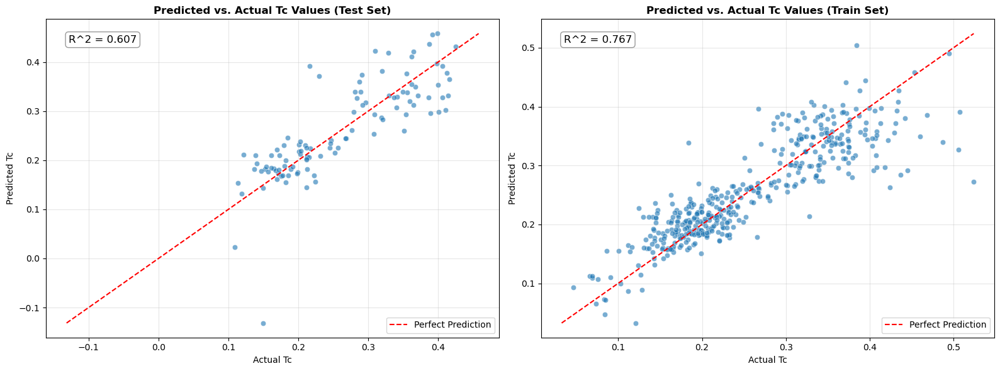

In [75]:
# Get predictions for the test set
y_pred_test = linear_regressor.predict(df_test[FEATURES_COLS])
y_true_test = df_test[TARGET_COLS]

# Get predictions for the train set
y_pred_train = linear_regressor.predict(df_train[FEATURES_COLS])
y_true_train = df_train[TARGET_COLS]

# Calculate R-squared scores
r2_test = r2_score(y_true_test, y_pred_test)
r2_train = r2_score(y_true_train, y_pred_train)

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6)) # 1 row, 2 columns

# Plot for Test Set
ax = axes[0]
sns.scatterplot(x=y_true_test, y=y_pred_test, alpha=0.6, ax=ax)
min_val_test = min(y_true_test.min(), y_pred_test.min())
max_val_test = max(y_true_test.max(), y_pred_test.max())
ax.plot([min_val_test, max_val_test], [min_val_test, max_val_test], color='red', linestyle='--', label='Perfect Prediction')
ax.text(0.05, 0.95, f'R^2 = {r2_test:.3f}', transform=ax.transAxes, fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round,pad=0.3', fc='white', ec='gray', lw=1, alpha=0.8))
ax.set_title('Predicted vs. Actual Tc Values (Test Set)', fontweight='bold')
ax.set_xlabel('Actual Tc')
ax.set_ylabel('Predicted Tc')
ax.grid(True, alpha=0.3)
ax.legend()

# Plot for Train Set
ax = axes[1]
sns.scatterplot(x=y_true_train, y=y_pred_train, alpha=0.6, ax=ax)
min_val_train = min(y_true_train.min(), y_pred_train.min())
max_val_train = max(y_true_train.max(), y_pred_train.max())
ax.plot([min_val_train, max_val_train], [min_val_train, max_val_train], color='red', linestyle='--', label='Perfect Prediction')
ax.text(0.05, 0.95, f'R^2 = {r2_train:.3f}', transform=ax.transAxes, fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round,pad=0.3', fc='white', ec='gray', lw=1, alpha=0.8))
ax.set_title('Predicted vs. Actual Tc Values (Train Set)', fontweight='bold')
ax.set_xlabel('Actual Tc')
ax.set_ylabel('Predicted Tc')
ax.grid(True, alpha=0.3)
ax.legend()

plt.tight_layout()
plt.show()

Kernel Model

In [76]:
krr = KernelRidge(kernel='rbf')
krr.fit(df_train[FEATURES_COLS], df_train[TARGET_COLS])

,alpha,1
,kernel,'rbf'
,gamma,None
,degree,3
,coef0,1
,kernel_params,None


In [77]:
# get the metrics on the train and the test set using the linear_regression_metrics function
krr_results_train = get_regression_metrics(krr, df_train[FEATURES_COLS], df_train[TARGET_COLS])
krr_results_test = get_regression_metrics(krr, df_test[FEATURES_COLS], df_test[TARGET_COLS])

# Print the results
print("Kernel Ridge Regression Results - Train Set:", krr_results_train)
print("Kernel Ridge Regression Results - Test Set:", krr_results_test)

Kernel Ridge Regression Results - Train Set: {'mae': 0.10506360006574639, 'mse': 0.01401737740650485, 'max_error': 0.2619980428381105, 'mape': 0.4036896836174581}
Kernel Ridge Regression Results - Test Set: {'mae': 0.21164265710687843, 'mse': 0.05795968479360798, 'max_error': 0.4140832426279492, 'mape': 0.781993360845638}


Kernel Visualization (unoptimized)

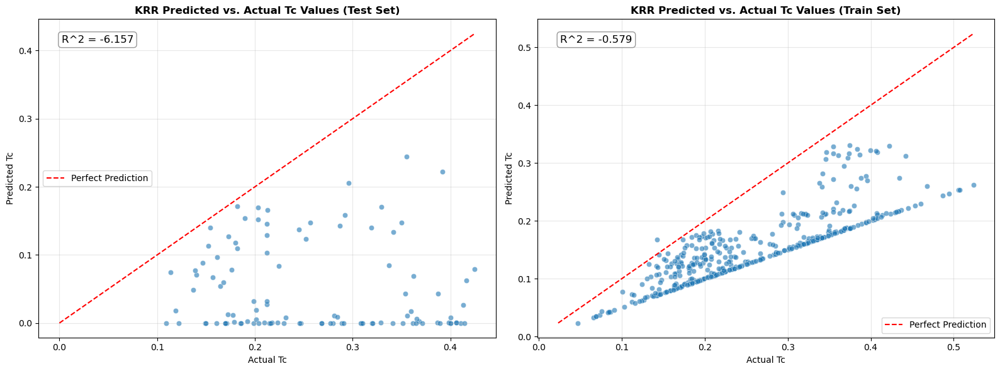

In [78]:
# Get predictions for the test set from KRR model
y_pred_test_krr = krr.predict(df_test[FEATURES_COLS])
y_true_test_krr = df_test[TARGET_COLS] 

# Get predictions for the train set from KRR model
y_pred_train_krr = krr.predict(df_train[FEATURES_COLS])
y_true_train_krr = df_train[TARGET_COLS] 

# Calculate R-squared scores for KRR
r2_test_krr = r2_score(y_true_test_krr, y_pred_test_krr)
r2_train_krr = r2_score(y_true_train_krr, y_pred_train_krr)

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6)) # 1 row, 2 columns

# Plot for Test Set (KRR)
ax = axes[0]
sns.scatterplot(x=y_true_test_krr, y=y_pred_test_krr, alpha=0.6, ax=ax)
min_val_test = min(y_true_test_krr.min(), y_pred_test_krr.min())
max_val_test = max(y_true_test_krr.max(), y_pred_test_krr.max())
ax.plot([min_val_test, max_val_test], [min_val_test, max_val_test], color='red', linestyle='--', label='Perfect Prediction')
ax.text(0.05, 0.95, f'R^2 = {r2_test_krr:.3f}', transform=ax.transAxes, fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round,pad=0.3', fc='white', ec='gray', lw=1, alpha=0.8))
ax.set_title('KRR Predicted vs. Actual Tc Values (Test Set)', fontweight='bold')
ax.set_xlabel('Actual Tc')
ax.set_ylabel('Predicted Tc')
ax.grid(True, alpha=0.3)
ax.legend()

# Plot for Train Set (KRR)
ax = axes[1]
sns.scatterplot(x=y_true_train_krr, y=y_pred_train_krr, alpha=0.6, ax=ax)
min_val_train = min(y_true_train.min(), y_pred_train_krr.min())
max_val_train = max(y_true_train.max(), y_pred_train_krr.max())
ax.plot([min_val_train, max_val_train], [min_val_train, max_val_train], color='red', linestyle='--', label='Perfect Prediction')
ax.text(0.05, 0.95, f'R^2 = {r2_train_krr:.3f}', transform=ax.transAxes, fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round,pad=0.3', fc='white', ec='gray', lw=1, alpha=0.8))
ax.set_title('KRR Predicted vs. Actual Tc Values (Train Set)', fontweight='bold')
ax.set_xlabel('Actual Tc')
ax.set_ylabel('Predicted Tc')
ax.grid(True, alpha=0.3)
ax.legend()

plt.tight_layout()
plt.show()

Kernel Model (using pipeline)

In [79]:
pipe_krr = Pipeline(
    [
        ('variance_treshold', VarianceThreshold(1)),
        ('selectkbest', SelectKBest(score_func=f_regression)), # Add SelectKBest for feature selection
        ('scaling', MinMaxScaler()), #just a placeholder, will be set in hyperparameter tuning
        ('krr', KernelRidge(kernel='rbf'))
    ]
)

In [80]:
krr_param_grid = {
                    'scaling': [None, MinMaxScaler(), StandardScaler()], 
                    'selectkbest__k': [2, 3, 4, 5,6,7,8,9,10,11, 12,13,14], # Number of features to select
                    'krr__alpha': np.logspace(-10,10,10),
                    'krr__gamma':np.logspace(-10,10,10), 
                    'variance_treshold__threshold':[0.0, 1e-3, 1e-2, 1e-1]
            }

krr_search = RandomizedSearchCV(pipe_krr, param_distributions=krr_param_grid, n_iter=200,
                        cv=10, verbose=2, n_jobs=-1, random_state=RANDOM_SEED)

In [81]:
# Fit the pipeline and run the evaluation
krr_search.fit(df_train[FEATURES_COLS], df_train[TARGET_COLS]) 

Fitting 10 folds for each of 200 candidates, totalling 2000 fits
[CV] END krr__alpha=59948425.03189421, krr__gamma=10000000000.0, scaling=StandardScaler(), selectkbest__k=6, variance_treshold__threshold=0.0; total time=   0.0s
[CV] END krr__alpha=59948425.03189421, krr__gamma=10000000000.0, scaling=StandardScaler(), selectkbest__k=6, variance_treshold__threshold=0.0; total time=   0.0s
[CV] END krr__alpha=59948425.03189421, krr__gamma=10000000000.0, scaling=StandardScaler(), selectkbest__k=6, variance_treshold__threshold=0.0; total time=   0.0s
[CV] END krr__alpha=59948425.03189421, krr__gamma=10000000000.0, scaling=StandardScaler(), selectkbest__k=6, variance_treshold__threshold=0.0; total time=   0.0s
[CV] END krr__alpha=1.6681005372000592e-08, krr__gamma=2.782559402207126e-06, scaling=MinMaxScaler(), selectkbest__k=12, variance_treshold__threshold=0.01; total time=   0.0s
[CV] END krr__alpha=1.6681005372000592e-08, krr__gamma=2.782559402207126e-06, scaling=MinMaxScaler(), selectkbes

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END krr__alpha=10000000000.0, krr__gamma=12.915496650148826, scaling=MinMaxScaler(), selectkbest__k=5, variance_treshold__threshold=0.0; total time=   0.0s
[CV] END krr__alpha=0.07742636826811278, krr__gamma=1.6681005372000592e-08, scaling=StandardScaler(), selectkbest__k=9, variance_treshold__threshold=0.1; total time=   0.0s
[CV] END krr__alpha=2154.4346900318865, krr__gamma=359381.36638046405, scaling=None, selectkbest__k=7, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__alpha=359381.36638046405, krr__gamma=1.6681005372000592e-08, scaling=MinMaxScaler(), selectkbest__k=10, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__alpha=10000000000.0, krr__gamma=12.915496650148826, scaling=MinMaxScaler(), selectkbest__k=5, variance_treshold__threshold=0.0; total time=   0.0s
[CV] END krr__alpha=10000000000.0, krr__gamma=12.915496650148826, scaling=MinMaxScaler(), selectkbest__k=5, variance_treshold__threshold=0.0; total time=   0.0s
[CV] END krr_

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END krr__alpha=59948425.03189421, krr__gamma=12.915496650148826, scaling=None, selectkbest__k=10, variance_treshold__threshold=0.0; total time=   0.0s
[CV] END krr__alpha=2154.4346900318865, krr__gamma=0.0004641588833612782, scaling=StandardScaler(), selectkbest__k=8, variance_treshold__threshold=0.1; total time=   0.0s
[CV] END krr__alpha=1.6681005372000592e-08, krr__gamma=1e-10, scaling=MinMaxScaler(), selectkbest__k=12, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__alpha=0.0004641588833612782, krr__gamma=2.782559402207126e-06, scaling=None, selectkbest__k=4, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__alpha=59948425.03189421, krr__gamma=0.0004641588833612782, scaling=StandardScaler(), selectkbest__k=3, variance_treshold__threshold=0.01; total time=   0.0s
[CV] END krr__alpha=2154.4346900318865, krr__gamma=0.0004641588833612782, scaling=StandardScaler(), selectkbest__k=8, variance_treshold__threshold=0.1; total time=   0.0s
[CV] EN

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END krr__alpha=2154.4346900318865, krr__gamma=0.07742636826811278, scaling=StandardScaler(), selectkbest__k=11, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__alpha=0.0004641588833612782, krr__gamma=1.6681005372000592e-08, scaling=MinMaxScaler(), selectkbest__k=13, variance_treshold__threshold=0.0; total time=   0.0s
[CV] END krr__alpha=0.07742636826811278, krr__gamma=12.915496650148826, scaling=None, selectkbest__k=12, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__alpha=1e-10, krr__gamma=1e-10, scaling=StandardScaler(), selectkbest__k=8, variance_treshold__threshold=0.01; total time=   0.0s
[CV] END krr__alpha=2154.4346900318865, krr__gamma=0.07742636826811278, scaling=StandardScaler(), selectkbest__k=11, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__alpha=10000000000.0, krr__gamma=12.915496650148826, scaling=MinMaxScaler(), selectkbest__k=9, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__al

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END krr__alpha=0.0004641588833612782, krr__gamma=0.07742636826811278, scaling=StandardScaler(), selectkbest__k=5, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__alpha=12.915496650148826, krr__gamma=0.07742636826811278, scaling=MinMaxScaler(), selectkbest__k=3, variance_treshold__threshold=0.0; total time=   0.0s
[CV] END krr__alpha=0.0004641588833612782, krr__gamma=1e-10, scaling=StandardScaler(), selectkbest__k=10, variance_treshold__threshold=0.0; total time=   0.0s
[CV] END krr__alpha=10000000000.0, krr__gamma=1.6681005372000592e-08, scaling=None, selectkbest__k=14, variance_treshold__threshold=0.01; total time=   0.0s
[CV] END krr__alpha=59948425.03189421, krr__gamma=12.915496650148826, scaling=None, selectkbest__k=5, variance_treshold__threshold=0.0; total time=   0.0s
[CV] END krr__alpha=0.07742636826811278, krr__gamma=1.6681005372000592e-08, scaling=MinMaxScaler(), selectkbest__k=14, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END krr__alpha=10000000000.0, krr__gamma=0.0004641588833612782, scaling=MinMaxScaler(), selectkbest__k=6, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__alpha=12.915496650148826, krr__gamma=1e-10, scaling=None, selectkbest__k=7, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__alpha=0.07742636826811278, krr__gamma=10000000000.0, scaling=None, selectkbest__k=12, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__alpha=2154.4346900318865, krr__gamma=10000000000.0, scaling=StandardScaler(), selectkbest__k=7, variance_treshold__threshold=0.0; total time=   0.0s
[CV] END krr__alpha=2154.4346900318865, krr__gamma=0.07742636826811278, scaling=None, selectkbest__k=4, variance_treshold__threshold=0.0; total time=   0.0s
[CV] END krr__alpha=0.07742636826811278, krr__gamma=10000000000.0, scaling=None, selectkbest__k=12, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__alpha=12.915496650148826, krr__gamma=1e-10, s

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

), selectkbest__k=7, variance_treshold__threshold=0.01; total time=   0.0s
[CV] END krr__alpha=1e-10, krr__gamma=12.915496650148826, scaling=MinMaxScaler(), selectkbest__k=7, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__alpha=59948425.03189421, krr__gamma=359381.36638046405, scaling=MinMaxScaler(), selectkbest__k=13, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__alpha=359381.36638046405, krr__gamma=10000000000.0, scaling=MinMaxScaler(), selectkbest__k=12, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__alpha=10000000000.0, krr__gamma=1e-10, scaling=StandardScaler(), selectkbest__k=2, variance_treshold__threshold=0.1; total time=   0.0s
[CV] END krr__alpha=1.6681005372000592e-08, krr__gamma=12.915496650148826, scaling=None, selectkbest__k=11, variance_treshold__threshold=0.0; total time=   0.0s
[CV] END krr__alpha=1e-10, krr__gamma=12.915496650148826, scaling=MinMaxScaler(), selectkbest__k=7, variance_treshold__threshol

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END krr__alpha=10000000000.0, krr__gamma=359381.36638046405, scaling=None, selectkbest__k=10, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__alpha=359381.36638046405, krr__gamma=2154.4346900318865, scaling=MinMaxScaler(), selectkbest__k=6, variance_treshold__threshold=0.0; total time=   0.0s
[CV] END krr__alpha=1.6681005372000592e-08, krr__gamma=1e-10, scaling=StandardScaler(), selectkbest__k=8, variance_treshold__threshold=0.0; total time=   0.0s
[CV] END krr__alpha=0.0004641588833612782, krr__gamma=0.07742636826811278, scaling=StandardScaler(), selectkbest__k=7, variance_treshold__threshold=0.0; total time=   0.0s
[CV] END krr__alpha=0.07742636826811278, krr__gamma=2.782559402207126e-06, scaling=MinMaxScaler(), selectkbest__k=7, variance_treshold__threshold=0.01; total time=   0.0s
[CV] END krr__alpha=0.07742636826811278, krr__gamma=0.07742636826811278, scaling=StandardScaler(), selectkbest__k=4, variance_treshold__threshold=0.01; total time=   0.0s
[CV] EN

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END krr__alpha=59948425.03189421, krr__gamma=12.915496650148826, scaling=MinMaxScaler(), selectkbest__k=12, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__alpha=59948425.03189421, krr__gamma=0.07742636826811278, scaling=MinMaxScaler(), selectkbest__k=11, variance_treshold__threshold=0.01; total time=   0.0s
[CV] END krr__alpha=59948425.03189421, krr__gamma=2154.4346900318865, scaling=None, selectkbest__k=7, variance_treshold__threshold=0.1; total time=   0.0s
[CV] END krr__alpha=59948425.03189421, krr__gamma=12.915496650148826, scaling=MinMaxScaler(), selectkbest__k=12, variance_treshold__threshold=0.001; total time=   0.0s
[CV] END krr__alpha=0.0004641588833612782, krr__gamma=2154.4346900318865, scaling=MinMaxScaler(), selectkbest__k=6, variance_treshold__threshold=0.01; total time=   0.0s
[CV] END krr__alpha=0.07742636826811278, krr__gamma=2.782559402207126e-06, scaling=MinMaxScaler(), selectkbest__k=3, variance_treshold__threshold=0.01; total time=   0.0s


,estimator,Pipeline(step...rnel='rbf'))])
,param_distributions,"{'krr__alpha': array([1.0000...00000000e+10]), 'krr__gamma': array([1.0000...00000000e+10]), 'scaling': [None, MinMaxScaler(), ...], 'selectkbest__k': [2, 3, ...], ...}"
,n_iter,200
,scoring,None
,n_jobs,-1
,refit,True
,cv,10
,verbose,2
,pre_dispatch,'2*n_jobs'
,random_state,101
,error_score,nan


In [82]:
# Get the best estimator from RandomizedSearchCV
best_krr_pipeline = krr_search.best_estimator_

print("Best KRR Pipeline Parameters:")
print(krr_search.best_params_)

# Get the metrics on the train and the test set using the best KRR pipeline
tuned_krr_results_train = get_regression_metrics(best_krr_pipeline, df_train[FEATURES_COLS], df_train[TARGET_COLS])
tuned_krr_results_test = get_regression_metrics(best_krr_pipeline, df_test[FEATURES_COLS], df_test[TARGET_COLS])

# Print the results
print("\nTuned Kernel Ridge Regression Results - Train Set:", tuned_krr_results_train)
print("Tuned Kernel Ridge Regression Results - Test Set:", tuned_krr_results_test)

Best KRR Pipeline Parameters:
{'variance_treshold__threshold': 0.0, 'selectkbest__k': 7, 'scaling': StandardScaler(), 'krr__gamma': np.float64(0.07742636826811278), 'krr__alpha': np.float64(0.07742636826811278)}

Tuned Kernel Ridge Regression Results - Train Set: {'mae': 0.02424737074373458, 'mse': 0.0011139493032821025, 'max_error': 0.2193587923648903, 'mape': 0.10683809315794063}
Tuned Kernel Ridge Regression Results - Test Set: {'mae': 0.028305776493269524, 'mse': 0.0014698900509704004, 'max_error': 0.16416437034627582, 'mape': 0.11967701506070881}


In [83]:
best_krr_pipeline

,steps,"[('variance_treshold', ...), ('selectkbest', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,threshold,0.0
,score_func,<function f_r...x735bb77fe7a0>
,k,7
,copy,True
,with_mean,True
,with_std,True
,alpha,np.float64(0....2636826811278)


Kernel Visualization

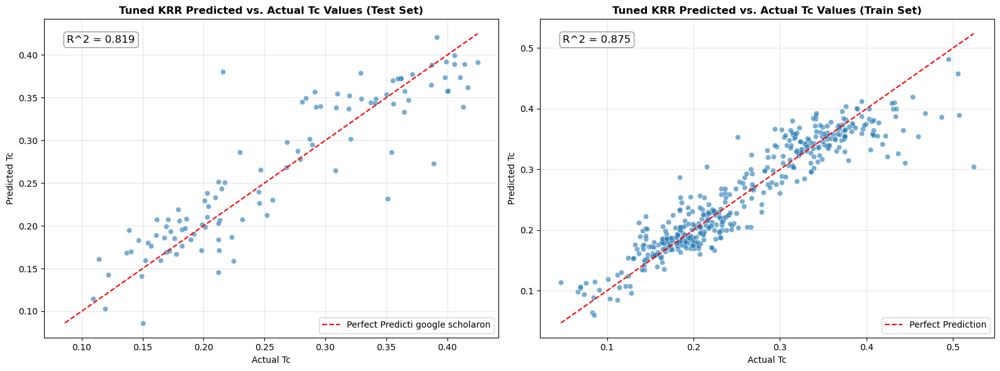

In [84]:
# Get predictions for the test set from the best tuned KRR model
y_pred_test_tuned_krr = best_krr_pipeline.predict(df_test[FEATURES_COLS])
y_true_test_tuned_krr = df_test[TARGET_COLS] 

# Get predictions for the train set from the best tuned KRR model
y_pred_train_tuned_krr = best_krr_pipeline.predict(df_train[FEATURES_COLS])
y_true_train_tuned_krr = df_train[TARGET_COLS]

# Calculate R-squared scores for tuned KRR
r2_test_tuned_krr = r2_score(y_true_test_tuned_krr, y_pred_test_tuned_krr)
r2_train_tuned_krr = r2_score(y_true_train_tuned_krr, y_pred_train_tuned_krr)

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6)) # 1 row, 2 columns

# Plot for Test Set (Tuned KRR)
ax = axes[0]
sns.scatterplot(x=y_true_test_tuned_krr, y=y_pred_test_tuned_krr, alpha=0.6, ax=ax)
min_val_test = min(y_true_test_tuned_krr.min(), y_pred_test_tuned_krr.min())
max_val_test = max(y_true_test_tuned_krr.max(), y_pred_test_tuned_krr.max())
ax.plot([min_val_test, max_val_test], [min_val_test, max_val_test], color='red', linestyle='--', label='Perfect Predicti google scholaron')
ax.text(0.05, 0.95, f'R^2 = {r2_test_tuned_krr:.3f}', transform=ax.transAxes, fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round,pad=0.3', fc='white', ec='gray', lw=1, alpha=0.8))
ax.set_title('Tuned KRR Predicted vs. Actual Tc Values (Test Set)', fontweight='bold')
ax.set_xlabel('Actual Tc')
ax.set_ylabel('Predicted Tc')
ax.grid(True, alpha=0.3)
ax.legend()

# Plot for Train Set (Tuned KRR)
ax = axes[1]
sns.scatterplot(x=y_true_train_tuned_krr, y=y_pred_train_tuned_krr, alpha=0.6, ax=ax)
min_val_train = min(y_true_train_tuned_krr.min(), y_pred_train_tuned_krr.min())
max_val_train = max(y_true_train_tuned_krr.max(), y_pred_train_tuned_krr.max())
ax.plot([min_val_train, max_val_train], [min_val_train, max_val_train], color='red', linestyle='--', label='Perfect Prediction')
ax.text(0.05, 0.95, f'R^2 = {r2_train_tuned_krr:.3f}', transform=ax.transAxes, fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round,pad=0.3', fc='white', ec='gray', lw=1, alpha=0.8))
ax.set_title('Tuned KRR Predicted vs. Actual Tc Values (Train Set)', fontweight='bold')
ax.set_xlabel('Actual Tc')
ax.set_ylabel('Predicted Tc')
ax.grid(True, alpha=0.3)
ax.legend()

plt.tight_layout()
plt.show()

In [85]:
#apply model to neurips challenge set
X_cc = cc_with_descriptors[list(FEATURES_COLS)]
y_true_cc = cc_with_descriptors[TARGET_COLS]

neurips_test = get_regression_metrics(best_krr_pipeline, X_cc, y_true_cc)

print("\nNeurIPS Challenge Set Regression Results:", neurips_test)


NeurIPS Challenge Set Regression Results: {'mae': 0.020310091797956415, 'mse': 0.00045980486135509014, 'max_error': 0.028312756697900482, 'mape': 0.08292841892139245}


XGBoost

In [86]:
# Initialize the XGBoost Regressor model
xgb_regressor = xgb.XGBRegressor(objective='reg:squarederror', random_state=RANDOM_SEED)

# Train the model on the training data
xgb_regressor.fit(df_train[FEATURES_COLS], df_train[TARGET_COLS])

xgb_results_train = get_regression_metrics(xgb_regressor, df_train[FEATURES_COLS], df_train[TARGET_COLS])
xgb_results_test = get_regression_metrics(xgb_regressor, df_test[FEATURES_COLS], df_test[TARGET_COLS])

# Print the results
print("XGBoost Regression Results - Train Set:", xgb_results_train)
print("XGBoost Regression Results - Test Set:", xgb_results_test)

XGBoost Regression Results - Train Set: {'mae': 0.0010559171166267612, 'mse': 2.4614836643651344e-06, 'max_error': 0.008408972740173326, 'mape': 0.004495978779667334}
XGBoost Regression Results - Test Set: {'mae': 0.032725127719140455, 'mse': 0.0020418188587246074, 'max_error': 0.16780688428878784, 'mape': 0.13383704296545437}


XGBoost Visualization (unoptimized)

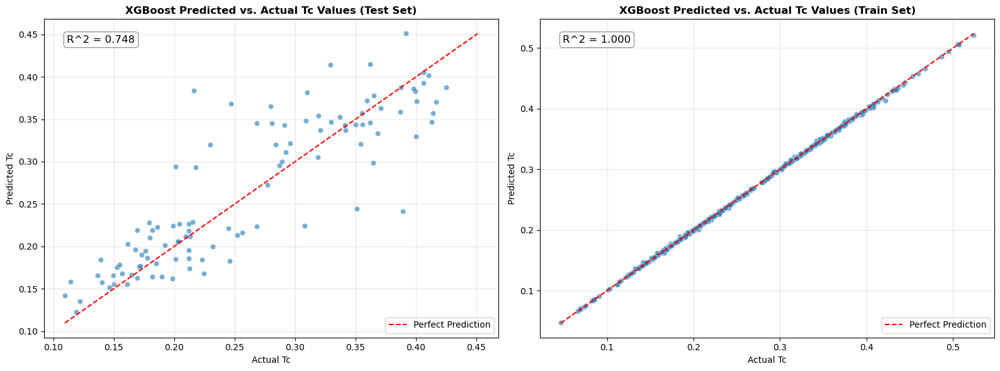

In [87]:
# Get predictions for the test set from XGBoost model
y_pred_test_xgb = xgb_regressor.predict(df_test[FEATURES_COLS])
y_true_test_xgb = df_test[TARGET_COLS] 

# Get predictions for the train set from XGBoost model
y_pred_train_xgb = xgb_regressor.predict(df_train[FEATURES_COLS])
y_true_train_xgb = df_train[TARGET_COLS] 

# Calculate R-squared scores for XGBoost
r2_test_xgb = r2_score(y_true_test_xgb, y_pred_test_xgb)
r2_train_xgb = r2_score(y_true_train_xgb, y_pred_train_xgb)

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6)) # 1 row, 2 columns

# Plot for Test Set (XGBoost)
ax = axes[0]
sns.scatterplot(x=y_true_test_xgb, y=y_pred_test_xgb, alpha=0.6, ax=ax)
min_val_test = min(y_true_test_xgb.min(), y_pred_test_xgb.min())
max_val_test = max(y_true_test_xgb.max(), y_pred_test_xgb.max())
ax.plot([min_val_test, max_val_test], [min_val_test, max_val_test], color='red', linestyle='--', label='Perfect Prediction')
ax.text(0.05, 0.95, f'R^2 = {r2_test_xgb:.3f}', transform=ax.transAxes, fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round,pad=0.3', fc='white', ec='gray', lw=1, alpha=0.8))
ax.set_title('XGBoost Predicted vs. Actual Tc Values (Test Set)', fontweight='bold')
ax.set_xlabel('Actual Tc')
ax.set_ylabel('Predicted Tc')
ax.grid(True, alpha=0.3)
ax.legend()

# Plot for Train Set (XGBoost)
ax = axes[1]
sns.scatterplot(x=y_true_train_xgb, y=y_pred_train_xgb, alpha=0.6, ax=ax)
min_val_train = min(y_true_train_xgb.min(), y_pred_train_xgb.min())
max_val_train = max(y_true_train_xgb.max(), y_pred_train_xgb.max())
ax.plot([min_val_train, max_val_train], [min_val_train, max_val_train], color='red', linestyle='--', label='Perfect Prediction')
ax.text(0.05, 0.95, f'R^2 = {r2_train_xgb:.3f}', transform=ax.transAxes, fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round,pad=0.3', fc='white', ec='gray', lw=1, alpha=0.8))
ax.set_title('XGBoost Predicted vs. Actual Tc Values (Train Set)', fontweight='bold')
ax.set_xlabel('Actual Tc')
ax.set_ylabel('Predicted Tc')
ax.grid(True, alpha=0.3)
ax.legend()

plt.tight_layout()
plt.show()

XGBoost (using Pipeline)

In [88]:
# Define the pipeline for XGBoost with SelectKBest for feature selection
pipe_XGboost = Pipeline(
    [
        ('variance_threshold', VarianceThreshold()), 
        ('selectkbest', SelectKBest(score_func=f_regression)), 
        ('scaling', StandardScaler()), 
        ('xgbregressor', xgb.XGBRegressor(objective='reg:squarederror', random_state=RANDOM_SEED))
    ]
)

In [89]:
param_grid_xgboost = {
    'variance_threshold__threshold': [0.0, 1e-4, 1e-3, 1e-2, 1e-1, 0.2, 0.5], # Expanded range
    'selectkbest__k': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,13,14], 
    'scaling': [None, StandardScaler(), MinMaxScaler()],
    'xgbregressor__n_estimators': [100, 200, 400, 600, 800, 1000], # Increased upper bound
    'xgbregressor__learning_rate': [0.005, 0.01, 0.05, 0.1, 0.2, 0.3], # Expanded range
    'xgbregressor__max_depth': [3, 5, 7, 10, 12, 15], # Increased upper bound
    'xgbregressor__min_child_weight': [1, 3, 5, 7, 10, 15], # Increased upper bound
    'xgbregressor__gamma': [0, 0.05, 0.1, 0.2, 0.4, 0.6, 0.8], # Expanded range
    'xgbregressor__subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0], # Expanded range
    'xgbregressor__colsample_bytree': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0], # Expanded range
    'xgbregressor__reg_alpha': [0, 0.01, 0.1, 1, 10], # L1 regularization
    'xgbregressor__reg_lambda': [0, 0.01, 0.1, 1, 10] # L2 regularization
}

random_xgboost_search = RandomizedSearchCV(pipe_XGboost, param_distributions=param_grid_xgboost, n_iter=500,
                        cv=10, verbose=2, n_jobs=-1, random_state=RANDOM_SEED)

In [90]:
# Fit the pipeline and run the evaluation
random_xgboost_search.fit(df_train[FEATURES_COLS], df_train[TARGET_COLS])

Fitting 10 folds for each of 500 candidates, totalling 5000 fits
[CV] END scaling=MinMaxScaler(), selectkbest__k=14, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=5, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.8; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=14, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=5, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.8; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=14, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.8, xgbregressor__learning_ra

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=9, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=3, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=9, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=3, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=12, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=10, xgbregressor__min_chi

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=None, selectkbest__k=5, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=3, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.7; total time=   0.0s[CV] END scaling=MinMaxScaler(), selectkbest__k=14, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=15, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.6; total time=   0.0s

[CV] END scaling=None, selectkbest__k=8, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=15, xgbregressor__min_child_weight=10, xgbregress

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=9, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=5, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.6; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=12, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=3, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=9, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=5, xgbregressor__min_child_w

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=6, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=3, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=1, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=None, selectkbest__k=9, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=10, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=None, selectkbest__k=13, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=7, xgbregressor__min_child_weight=7, xgbregressor__n_

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=14, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=15, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=0, xgbregressor__subsample=1.0; total time=   0.2s
[CV] END scaling=MinMaxScaler(), selectkbest__k=6, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=3, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=1, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=9, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=3, xgbregressor__min_child_weig

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=None, selectkbest__k=5, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=12, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=9, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=5, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=9, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=5, xgbregressor__min_child_weight=7, xgb

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=7, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=7, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.6; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=12, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=5, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.9; total time=   0.1s
[CV] END scaling=StandardScaler(), selectkbest__k=5, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=10, xgbregressor__min_child_weig

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=5, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=10, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.7; total time=   0.2s
[CV] END scaling=StandardScaler(), selectkbest__k=6, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=3, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=None, selectkbest__k=12, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=10, xgbregressor__min_child_weight=15, x

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END scaling=MinMaxScaler(), selectkbest__k=13, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=12, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=12, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=5, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.9; total time=   0.1s
[CV] END scaling=None, selectkbest__k=5, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=5, xgbregressor__min_child_weight=15, xgbregr

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=13, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=12, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=11, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=5, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.7; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=12, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=5, xgbregressor__min_child_weight=7

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=12, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=5, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.9; total time=   0.1s
[CV] END scaling=MinMaxScaler(), selectkbest__k=9, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=10, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.8; total time=   0.0s
[CV] END scaling=None, selectkbest__k=6, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=10, xgbregressor__min_child_weight=5, xgbreg

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele


[CV] END scaling=MinMaxScaler(), selectkbest__k=10, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=5, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=10, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=7, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=14, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=12, xgbregressor__min_chil

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END scaling=StandardScaler(), selectkbest__k=4, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=10, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.6; total time=   0.0s
[CV] END scaling=None, selectkbest__k=14, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=12, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=None, selectkbest__k=10, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=5, xgbregressor__min_child_weight=5, xgbre

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=None, selectkbest__k=12, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=10, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=9, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=5, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=4, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=10, xgbregressor__min_child_weight=

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=6, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=5, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=14, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=10, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.7; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=6, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=5, xgbregressor__min_child_we

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END scaling=StandardScaler(), selectkbest__k=9, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=10, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=7, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=7, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.8; total time=   0.0s
[CV] END scaling=None, selectkbest__k=5, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=5, xgbregressor__min_child_weight=10, xgbregre

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=8, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=12, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.8; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=6, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=12, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=7, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=7, xgbregressor__min_chil

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=4, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=10, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.7; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=7, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=15, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.8; total time=   0.0s
[CV] END scaling=None, selectkbest__k=11, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=7, xgbregressor__min_child_weight=10, xgbreg

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=3, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=15, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.6; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=2, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=10, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=13, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=3, xgbregressor__min_child_weig

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END scaling=StandardScaler(), selectkbest__k=4, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=3, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.8; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=2, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=7, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=None, selectkbest__k=12, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=10, xgbregressor__min_child_weight=1, xgb

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=12, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=12, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=3, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=5, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=None, selectkbest__k=3, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=7, xgbregressor__min_child_weight=5, xg

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=None, selectkbest__k=9, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=12, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=None, selectkbest__k=7, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=10, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.7; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=4, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=3, xgbregressor__min_child_weight=15, xgbregress

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=None, selectkbest__k=3, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=7, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=4, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=3, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=1, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=3, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=7, xgbregressor__min_child_weight=1, xgbregre

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=13, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=12, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=1, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=None, selectkbest__k=12, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=5, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.6; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=5, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=10, xgbregressor__min_child_weight=15, x

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=14, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=5, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.7; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=8, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=7, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=1, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=11, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=3, xgbregressor__min_child_we

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=11, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=3, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.6; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=14, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=15, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=None, selectkbest__k=2, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=3, xgbregressor__min_child_weight=1, xg

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=5, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=15, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=None, selectkbest__k=8, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=12, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=12, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=7, xgbregressor__min_child_weight

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=12, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=5, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=12, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=7, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.7; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=12, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=5, xgbregressor__min_child

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END scaling=MinMaxScaler(), selectkbest__k=8, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=12, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.8; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=8, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=15, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=10, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=2, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=5, xgbregressor__min_child_weig

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=None, selectkbest__k=3, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=7, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.6; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=10, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=7, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.7; total time=   0.1s
[CV] END scaling=None, selectkbest__k=3, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=7, xgbregressor__min_child_weight=7, xgbregressor_

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=10, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=7, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.7; total time=   0.1s
[CV] END scaling=StandardScaler(), selectkbest__k=10, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=10, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=14, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=12, xgbregressor__min_child_weight=1

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=9, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=15, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.8; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=14, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=10, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.7; total time=   0.0s
[CV] END scaling=None, selectkbest__k=4, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=3, xgbregressor__min_child_weight=15, 

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=None, selectkbest__k=2, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=7, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.8; total time=   0.1s
[CV] END scaling=MinMaxScaler(), selectkbest__k=9, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=10, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=1.0; total time=   0.1s
[CV] END scaling=None, selectkbest__k=13, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=5, xgbregressor__min_child_weight=5, xgbregressor_

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END scaling=StandardScaler(), selectkbest__k=14, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=10, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.7; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=9, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=10, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=1.0; total time=   0.0s[CV] END scaling=None, selectkbest__k=11, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=7, xgbregressor__min_child_weight=15

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END scaling=MinMaxScaler(), selectkbest__k=5, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=12, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=5, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=12, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=None, selectkbest__k=10, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=7, xgbregressor__min_child_weight=7, xgbregre

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=None, selectkbest__k=7, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=15, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.7; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=12, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=7, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=1, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=2, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=10, xgbregressor__min_child_weight=1, xgbregres

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=12, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=7, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=1, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=None, selectkbest__k=7, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=7, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.6; total time=   0.1s
[CV] END scaling=None, selectkbest__k=14, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=12, xgbregressor__min_child_weight=5, xgbregressor__

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=6, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=3, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=None, selectkbest__k=10, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=10, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.8; total time=   0.1s[CV] END scaling=StandardScaler(), selectkbest__k=2, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=10, xgbregressor__min_child_weight=3

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=2, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=10, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.8; total time=   0.0s
[CV] END scaling=None, selectkbest__k=14, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=12, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.8; total time=   0.1s
[CV] END scaling=None, selectkbest__k=4, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=10, xgbregressor__min_child_weight=5, xgbregres

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=14, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=15, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=12, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=12, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.7; total time=   0.1s
[CV] END scaling=StandardScaler(), selectkbest__k=3, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=3, xgbregressor__min_child

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=12, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=12, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.7; total time=   0.1s[CV] END scaling=StandardScaler(), selectkbest__k=3, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=3, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.8; total time=   0.0s
[CV] END scaling=None, selectkbest__k=9, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=7, xgbregressor__min_child_weight=5, xgbr

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=6, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=15, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.8; total time=   0.0s
[CV] END scaling=None, selectkbest__k=13, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=10, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.8; total time=   0.1s
[CV] END scaling=None, selectkbest__k=4, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=10, xgbregressor__min_child_weight=15, xgbregre

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=4, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=3, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=11, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=5, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=None, selectkbest__k=12, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=5, xgbregressor__min_child_weight

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END scaling=StandardScaler(), selectkbest__k=10, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=12, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=5, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=15, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.7; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=7, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=7, xgbregressor__min

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=14, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=5, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.8; total time=   0.1s
[CV] END scaling=StandardScaler(), selectkbest__k=14, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=5, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.8; total time=   0.1s
[CV] END scaling=StandardScaler(), selectkbest__k=5, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=15, xgbregressor__min_child_weig

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=None, selectkbest__k=2, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=5, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=None, selectkbest__k=12, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=10, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=14, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=12, xgbregressor__min_child_weight=15, xgbregressor

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END scaling=MinMaxScaler(), selectkbest__k=3, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=12, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.6; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=3, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=12, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.6; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=3, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=12, xgbregressor__min_child_weight

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=3, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=7, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.8; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=13, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=5, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=10, xgbregressor__subsample=1.0; total time=   0.1s
[CV] END scaling=MinMaxScaler(), selectkbest__k=4, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=10, xgbregressor__min_chil

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=4, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=10, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.6; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=14, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=7, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.7; total time=   0.1s
[CV] END scaling=MinMaxScaler(), selectkbest__k=4, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=3, xgbregressor__min_child_wei

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=10, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=7, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=10, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=None, selectkbest__k=3, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=5, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=9, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=3, xgbregressor__min_child_weight=10, xgb

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END scaling=None, selectkbest__k=11, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=12, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.7; total time=   0.1s
[CV] END scaling=StandardScaler(), selectkbest__k=10, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=7, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=10, xgbregressor__subsample=1.0; total time=   0.1s
[CV] END scaling=None, selectkbest__k=7, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=3, xgbregressor__min_child_weight=7, xgbregressor__

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END scaling=None, selectkbest__k=11, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=12, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.7; total time=   0.1s
[CV] END scaling=StandardScaler(), selectkbest__k=10, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=3, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.7; total time=   0.0s
[CV] END scaling=None, selectkbest__k=7, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=3, xgbregressor__min_child_weight=7, xgbregressor__n

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=11, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=5, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.8; total time=   0.1s
[CV] END scaling=MinMaxScaler(), selectkbest__k=12, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=15, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.8; total time=   0.1s
[CV] END scaling=None, selectkbest__k=9, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=5, xgbregressor__min_child_weigh

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=14, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=7, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=None, selectkbest__k=11, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=7, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.9; total time=   0.1s
[CV] END scaling=MinMaxScaler(), selectkbest__k=8, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=3, xgbregressor__min_child_weight=1, xgbr

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END scaling=None, selectkbest__k=11, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=7, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.9; total time=   0.1s
[CV] END scaling=MinMaxScaler(), selectkbest__k=12, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=5, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.6; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=3, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=12, xgbregressor__min_child_weight=7, 

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=6, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=3, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.9; total time=   0.1s[CV] END scaling=None, selectkbest__k=8, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=3, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=1.0; total time=   0.0s

[CV] END scaling=None, selectkbest__k=4, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=5, xgbregressor__min_child_weight=15, xgbregressor__n

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=12, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=7, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.6; total time=   0.1s
[CV] END scaling=MinMaxScaler(), selectkbest__k=12, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=7, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.6; total time=   0.1s
[CV] END scaling=MinMaxScaler(), selectkbest__k=6, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=3, xgbregressor__min_child_weigh

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=9, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=10, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.7; total time=   0.1s
[CV] END scaling=None, selectkbest__k=8, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=5, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.9; total time=   0.1s
[CV] END scaling=StandardScaler(), selectkbest__k=9, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=10, xgbregressor__min_child_weig

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=9, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=10, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.7; total time=   0.1s
[CV] END scaling=MinMaxScaler(), selectkbest__k=12, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=12, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.7; total time=   0.1s
[CV] END scaling=None, selectkbest__k=4, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=3, xgbregressor__min_child_weight=

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=None, selectkbest__k=8, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=5, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.9; total time=   0.2s
[CV] END scaling=None, selectkbest__k=14, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=5, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.6; total time=   0.1s
[CV] END scaling=None, selectkbest__k=9, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=15, xgbregressor__min_child_weight=7, xgbregressor__n_estimato

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END scaling=MinMaxScaler(), selectkbest__k=2, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=7, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=1, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=2, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=15, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.6; total time=   0.2s
[CV] END scaling=MinMaxScaler(), selectkbest__k=2, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=15, xgbregressor__min_child_weight=3,

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=10, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=10, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.6; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=5, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=12, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.8; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=10, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=10, xgbregressor__min_child_weigh

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END scaling=StandardScaler(), selectkbest__k=10, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=10, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=5, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=5, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.6; total time=   0.1s
[CV] END scaling=MinMaxScaler(), selectkbest__k=10, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=5, xgbregressor__min_child_wei

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END scaling=MinMaxScaler(), selectkbest__k=3, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=12, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.6; total time=   0.0s
[CV] END scaling=None, selectkbest__k=9, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=5, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.8; total time=   0.0s
[CV] END scaling=None, selectkbest__k=4, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=10, xgbregressor__min_child_weight=7, xgbregressor__n

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=6, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=10, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=2, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=10, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=None, selectkbest__k=12, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=3, xgbregressor__min_child_weight=1,

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END scaling=None, selectkbest__k=9, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=7, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.7; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=6, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=3, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.7; total time=   0.1s
[CV] END scaling=MinMaxScaler(), selectkbest__k=13, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=12, xgbregressor__min_child_weight=15, xgbr

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END scaling=None, selectkbest__k=9, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=7, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.7; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=2, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=12, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.8; total time=   0.1s
[CV] END scaling=StandardScaler(), selectkbest__k=4, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=3, xgbregressor__min_child_weight=7, xgbregres

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=2, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=12, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.8; total time=   0.2s
[CV] END scaling=MinMaxScaler(), selectkbest__k=5, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=5, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.6; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=5, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=5, xgbregressor__min_child_weig

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=11, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=3, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.7; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=14, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=3, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=2, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=15, xgbregressor__min_chi

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=9, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=5, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=None, selectkbest__k=2, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=10, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=14, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=3, xgbregressor__min_child_weight=5, xgbr

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=13, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=10, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.6; total time=   0.1s
[CV] END scaling=MinMaxScaler(), selectkbest__k=2, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=10, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=1.0; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=2, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=12, xgbregressor__min_child_wei

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=8, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=5, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=None, selectkbest__k=3, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=12, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.7; total time=   0.0s
[CV] END scaling=None, selectkbest__k=7, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=5, xgbregressor__min_child_weight=15, xgbregressor__n

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=14, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=7, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.6; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=10, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=15, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=3, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=10, xgbregressor__min_

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=6, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=15, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=2, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=15, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.6; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=5, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=5, xgbregressor__min_c

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=None, selectkbest__k=3, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=5, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=14, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=12, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.8; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=14, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=5, xgbregressor__min_child_weigh

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=14, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=5, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.5; total time=   0.1s
[CV] END scaling=StandardScaler(), selectkbest__k=14, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=5, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.5; total time=   0.1s
[CV] END scaling=StandardScaler(), selectkbest__k=12, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=15, xgbregressor__min

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END scaling=StandardScaler(), selectkbest__k=6, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=15, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=None, selectkbest__k=3, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=12, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=1, xgbregressor__subsample=1.0; total time=   0.1s
[CV] END scaling=None, selectkbest__k=13, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=10, xgbregressor__min_child_weight=15, xgbregres

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END scaling=None, selectkbest__k=2, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=5, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=1, xgbregressor__subsample=0.5; total time=   0.1s
[CV] END scaling=None, selectkbest__k=9, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=5, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.8; total time=   0.0s
[CV] END scaling=None, selectkbest__k=7, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=15, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=60

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(



[CV] END scaling=None, selectkbest__k=12, variance_threshold__threshold=0.0001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=10, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=None, selectkbest__k=6, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=5, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=None, selectkbest__k=3, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=12, xgbregressor__min_child_weight=15, xgbregressor__n_

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=11, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=3, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.6; total time=   0.0s
[CV] END scaling=None, selectkbest__k=14, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.05, xgbregressor__max_depth=7, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=10, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=3, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=3, xgbregressor__min_child_weight=7,

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=10, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=5, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.8; total time=   0.2s
[CV] END scaling=StandardScaler(), selectkbest__k=12, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.5, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=5, xgbregressor__min_child_weight=5, xgbregressor__n_estimators=200, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.5; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=12, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=5, xgbregressor__min_child_we

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=MinMaxScaler(), selectkbest__k=3, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=10, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.8; total time=   0.1s
[CV] END scaling=None, selectkbest__k=8, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=3, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.7; total time=   0.0s
[CV] END scaling=MinMaxScaler(), selectkbest__k=2, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=10, xgbregressor__min_child_weight=5, xgbregr

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=None, selectkbest__k=8, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=1.0, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=3, xgbregressor__min_child_weight=1, xgbregressor__n_estimators=400, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.7; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=10, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=5, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.8; total time=   0.0s
[CV] END scaling=None, selectkbest__k=7, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.8, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=15, xgbregressor__min_child_weight=1, xgbregressor

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=4, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=15, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=0.01, xgbregressor__subsample=0.8; total time=   0.1s
[CV] END scaling=MinMaxScaler(), selectkbest__k=3, variance_threshold__threshold=0.5, xgbregressor__colsample_bytree=0.9, xgbregressor__gamma=0, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=10, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=1000, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.8; total time=   0.1s
[CV] END scaling=StandardScaler(), selectkbest__k=4, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=15, xgbregressor__min_child_wei

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END scaling=MinMaxScaler(), selectkbest__k=13, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=5, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=10, xgbregressor__subsample=1.0; total time=   0.1s
[CV] END scaling=StandardScaler(), selectkbest__k=12, variance_threshold__threshold=0.0, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=5, xgbregressor__min_child_weight=7, xgbregressor__n_estimators=600, xgbregressor__reg_alpha=0.01, xgbregressor__reg_lambda=0, xgbregressor__subsample=0.8; total time=   0.1s
[CV] END scaling=StandardScaler(), selectkbest__k=14, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.6, xgbregressor__learning_rate=0.3, xgbregressor__max_depth=15, xgbregressor__min_child

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=None, selectkbest__k=10, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.7, xgbregressor__gamma=0.1, xgbregressor__learning_rate=0.2, xgbregressor__max_depth=12, xgbregressor__min_child_weight=3, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.6; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=10, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=3, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=100, xgbregressor__reg_alpha=0.1, xgbregressor__reg_lambda=10, xgbregressor__subsample=0.9; total time=   0.0s
[CV] END scaling=StandardScaler(), selectkbest__k=10, variance_threshold__threshold=0.2, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.2, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=3, xgbregressor__min_child_weight=15, 

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END scaling=StandardScaler(), selectkbest__k=2, variance_threshold__threshold=0.1, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.1, xgbregressor__max_depth=10, xgbregressor__min_child_weight=15, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=1, xgbregressor__reg_lambda=0.1, xgbregressor__subsample=0.9; total time=   0.1s
[CV] END scaling=MinMaxScaler(), selectkbest__k=13, variance_threshold__threshold=0.001, xgbregressor__colsample_bytree=0.6, xgbregressor__gamma=0.4, xgbregressor__learning_rate=0.005, xgbregressor__max_depth=5, xgbregressor__min_child_weight=10, xgbregressor__n_estimators=800, xgbregressor__reg_alpha=0, xgbregressor__reg_lambda=10, xgbregressor__subsample=1.0; total time=   0.1s
[CV] END scaling=MinMaxScaler(), selectkbest__k=10, variance_threshold__threshold=0.01, xgbregressor__colsample_bytree=0.8, xgbregressor__gamma=0.05, xgbregressor__learning_rate=0.01, xgbregressor__max_depth=10, xgbregressor__min_child

,estimator,"Pipeline(step...=None, ...))])"
,param_distributions,"{'scaling': [None, StandardScaler(), ...], 'selectkbest__k': [2, 3, ...], 'variance_threshold__threshold': [0.0, 0.0001, ...], 'xgbregressor__colsample_bytree': [0.5, 0.6, ...], ...}"
,n_iter,500
,scoring,None
,n_jobs,-1
,refit,True
,cv,10
,verbose,2
,pre_dispatch,'2*n_jobs'
,random_state,101
,error_score,nan


In [91]:
# Get the best estimator from RandomizedSearchCV
best_xgboost_pipeline = random_xgboost_search.best_estimator_

print("Best XGBoost Pipeline Parameters:")
print(random_xgboost_search.best_params_)

# Get the metrics on the train and the test set using the best XGBoost pipeline
tuned_xgb_results_train = get_regression_metrics(best_xgboost_pipeline, df_train[FEATURES_COLS], df_train[TARGET_COLS])
tuned_xgb_results_test = get_regression_metrics(best_xgboost_pipeline, df_test[FEATURES_COLS], df_test[TARGET_COLS])

# Print the results
print("\nTuned XGBoost Regression Results - Train Set:", tuned_xgb_results_train)
print("Tuned XGBoost Regression Results - Test Set:", tuned_xgb_results_test)

Best XGBoost Pipeline Parameters:
{'xgbregressor__subsample': 0.5, 'xgbregressor__reg_lambda': 1, 'xgbregressor__reg_alpha': 0.1, 'xgbregressor__n_estimators': 1000, 'xgbregressor__min_child_weight': 10, 'xgbregressor__max_depth': 12, 'xgbregressor__learning_rate': 0.005, 'xgbregressor__gamma': 0, 'xgbregressor__colsample_bytree': 0.7, 'variance_threshold__threshold': 0.01, 'selectkbest__k': 11, 'scaling': MinMaxScaler()}

Tuned XGBoost Regression Results - Train Set: {'mae': 0.022579583506686454, 'mse': 0.0010274890435433518, 'max_error': 0.20590017342567446, 'mape': 0.10060589624178294}
Tuned XGBoost Regression Results - Test Set: {'mae': 0.031094287052571543, 'mse': 0.0016854622208695672, 'max_error': 0.1425697114467621, 'mape': 0.13434319481463022}


In [92]:
best_xgboost_pipeline

,steps,"[('variance_threshold', ...), ('selectkbest', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,threshold,0.01
,score_func,<function f_r...x735bb77fe7a0>
,k,11
,feature_range,"(0, ...)"
,copy,True
,clip,False
,objective,'reg:squarederror'


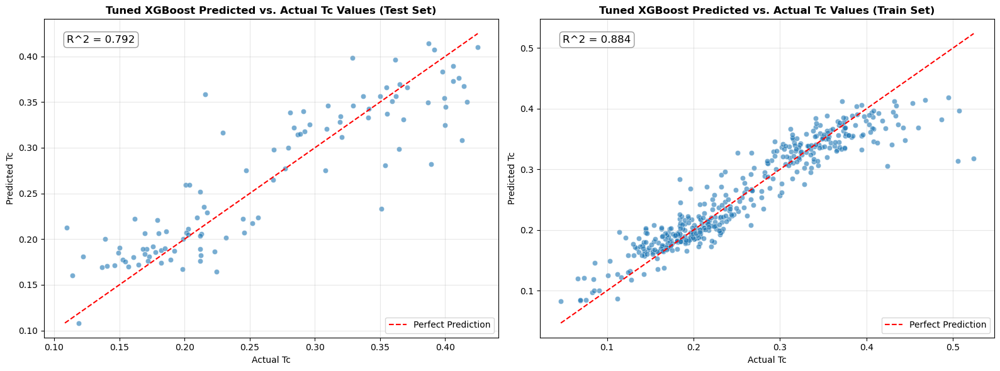

In [93]:
# Get predictions for the test set from the best tuned XGBoost model
y_pred_test_tuned_xgb = best_xgboost_pipeline.predict(df_test[FEATURES_COLS])
y_true_test_tuned_xgb = df_test[TARGET_COLS] 

# Get predictions for the train set from the best tuned XGBoost model
y_pred_train_tuned_xgb = best_xgboost_pipeline.predict(df_train[FEATURES_COLS])
y_true_train_tuned_xgb = df_train[TARGET_COLS] 

# Calculate R-squared scores for tuned XGBoost
r2_test_tuned_xgb = r2_score(y_true_test_tuned_xgb, y_pred_test_tuned_xgb)
r2_train_tuned_xgb = r2_score(y_true_train_tuned_xgb, y_pred_train_tuned_xgb)

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6)) # 1 row, 2 columns

# Plot for Test Set (Tuned XGBoost)
ax = axes[0]
sns.scatterplot(x=y_true_test_tuned_xgb, y=y_pred_test_tuned_xgb, alpha=0.6, ax=ax)
min_val_test = min(y_true_test_tuned_xgb.min(), y_pred_test_tuned_xgb.min())
max_val_test = max(y_true_test_tuned_xgb.max(), y_pred_test_tuned_xgb.max())
ax.plot([min_val_test, max_val_test], [min_val_test, max_val_test], color='red', linestyle='--', label='Perfect Prediction')
ax.text(0.05, 0.95, f'R^2 = {r2_test_tuned_xgb:.3f}', transform=ax.transAxes, fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round,pad=0.3', fc='white', ec='gray', lw=1, alpha=0.8))
ax.set_title('Tuned XGBoost Predicted vs. Actual Tc Values (Test Set)', fontweight='bold')
ax.set_xlabel('Actual Tc')
ax.set_ylabel('Predicted Tc')
ax.grid(True, alpha=0.3)
ax.legend()

# Plot for Train Set (Tuned XGBoost)
ax = axes[1]
sns.scatterplot(x=y_true_train_tuned_xgb, y=y_pred_train_tuned_xgb, alpha=0.6, ax=ax)
min_val_train = min(y_true_train_tuned_xgb.min(), y_pred_train_tuned_xgb.min())
max_val_train = max(y_true_train_tuned_xgb.max(), y_pred_train_tuned_xgb.max())
ax.plot([min_val_train, max_val_train], [min_val_train, max_val_train], color='red', linestyle='--', label='Perfect Prediction')
ax.text(0.05, 0.95, f'R^2 = {r2_train_tuned_xgb:.3f}', transform=ax.transAxes, fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round,pad=0.3', fc='white', ec='gray', lw=1, alpha=0.8))
ax.set_title('Tuned XGBoost Predicted vs. Actual Tc Values (Train Set)', fontweight='bold')
ax.set_xlabel('Actual Tc')
ax.set_ylabel('Predicted Tc')
ax.grid(True, alpha=0.3)
ax.legend()

plt.tight_layout()
plt.show()

Final Pipeline

In [94]:
pipe_final = Pipeline(
    [
        ('variance_threshold', VarianceThreshold()),
        ('selectkbest', SelectKBest(score_func=f_regression)),
        ('scaling', StandardScaler()), #placeholder
        ('estimator', None) #placeholder
    ]
)

In [95]:
#XGBoost hyperparameter grid
param_xgboost = {
    'estimator': [xgb.XGBRegressor(objective='reg:squarederror', random_state=RANDOM_SEED)], # Specific estimator instance
    'estimator__n_estimators': [50, 100, 200, 400, 600, 800, 1000], # Expanded range
    'estimator__learning_rate': [0.005, 0.01, 0.05, 0.1, 0.2, 0.3], # Expanded range
    'estimator__max_depth': [3, 5, 7, 10, 12, 15], # Expanded range
    'estimator__min_child_weight': [1, 3, 5, 7, 10, 15], # Expanded range
    'estimator__gamma': [0, 0.05, 0.1, 0.2, 0.4, 0.6, 0.8], # Expanded range
    'estimator__subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0], # Expanded range
    'estimator__colsample_bytree': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0], # Expanded range
}

#KRR hyperparameter grid
param_krr = {
    'estimator': [KernelRidge(kernel='rbf')], # Specific estimator instance
    'estimator__alpha': np.logspace(-10, 10, 10),
    'estimator__gamma': np.logspace(-10, 10, 10),
}

#Linear Regression hyperparameter grid
param_linear = {
    'estimator': [LinearRegression()], # Specific estimator instance
    # Linear Regression typically doesn't have many hyperparameters to tune in this context
    # but you could add regularization like Ridge or Lasso here if desired.
}

# Combine all hyperparameter grids
param_distributions_combined = [
    {
        **param_xgboost,
        'variance_threshold__threshold': [0.0, 1e-3, 1e-2, 1e-1],
        'selectkbest__k': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,13,14],
        'scaling': [None, StandardScaler(), MinMaxScaler()],
    },
    {
        **param_krr,
        'variance_threshold__threshold': [0.0, 1e-3, 1e-2, 1e-1, 0.5, 1.0],
        'selectkbest__k': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,13,14],
        'scaling': [None, StandardScaler(), MinMaxScaler()],
    },
    {
        **param_linear,
        'variance_threshold__threshold': [0.0, 1e-3, 1e-2, 1e-1],
        'selectkbest__k': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,13,14],
        'scaling': [None, StandardScaler(), MinMaxScaler()],
    }
]

In [96]:
random_final_search = RandomizedSearchCV(
    pipe_final,
    param_distributions=param_distributions_combined,
    n_iter=500,  # Number of parameter settings that are sampled. Trade-off between runtime and quality of the solution.
    cv=10,       # Cross-validation folds
    verbose=2,
    n_jobs=-1,  # Use all available cores
    random_state=RANDOM_SEED,
    scoring='neg_mean_squared_error' # Explicitly set scoring for regression
)

random_final_search.fit(df_train[FEATURES_COLS], df_train[TARGET_COLS])



Fitting 10 folds for each of 500 candidates, totalling 5000 fits
[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0.1, estimator__learning_rate=0.05, estimator__max_depth=3, estimator__min_child_weight=7, estimator__n_estimators=

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=1.0, estimator__gamma=0.6, estimator__learning_rate=0.2, estimator__max_depth=3, estimator__min_child_weight=3, estimator__n_estimators=100, estimator__subsample=1.0, scaling=None, selectkbest__k=10, va

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.7, estimator__gamma=0.2, estimator__learning_rate=0.1, estimator__max_depth=3, estimator__min_child_weight=7, estimator__n_estimators=600, estimator__subsample=0.5, scaling=None, selectkbest__k=3, var

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.8, estimator__gamma=0.4, estimator__learning_rate=0.05, estimator__max_depth=10, estimator__min_child_weight=10, estimator__n_estimators=400, estimator__subsample=0.9, scaling=StandardScaler(), select

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.6, estimator__gamma=0.8, estimator__learning_rate=0.01, estimator__max_depth=5, estimator__min_child_weight=5, estimator__n_estimators=600, estimator__subsample=0.8, scaling=MinMaxScaler(), selectkbes

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=1.0, estimator__gamma=0.1, estimator__learning_rate=0.1, estimator__max_depth=3, estimator__min_child_weight=3, estimator__n_estimators=50, estimator__subsample=0.7, scaling=StandardScaler(), selectkbes

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.6, estimator__gamma=0.1, estimator__learning_rate=0.005, estimator__max_depth=12, estimator__min_child_weight=1, estimator__n_estimators=600, estimator__subsample=0.8, scaling=MinMaxScaler(), selectkb

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.9, estimator__gamma=0.1, estimator__learning_rate=0.01, estimator__max_depth=3, estimator__min_child_weight=3, estimator__n_estimators=800, estimator__subsample=0.7, scaling=StandardScaler(), selectkb

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.8, estimator__gamma=0.6, estimator__learning_rate=0.3, estimator__max_depth=12, estimator__min_child_weight=3, estimator__n_estimators=1000, estimator__subsample=1.0, scaling=MinMaxScaler(), selectkbe

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.8, estimator__gamma=0.1, estimator__learning_rate=0.2, estimator__max_depth=7, estimator__min_child_weight=10, estimator__n_estimators=1000, estimator__subsample=0.9, scaling=None, selectkbest__k=11, 

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=1.0, estimator__gamma=0.4, estimator__learning_rate=0.3, estimator__max_depth=12, estimator__min_child_weight=10, estimator__n_estimators=800, estimator__subsample=0.9, scaling=None, selectkbest__k=4, v

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0.05, estimator__learning_rate=0.2, estimator__max_depth=12, estimator__min_child_weight=15, estimator__n_estimators=600, estimator__subsample=0.7, scaling=None, selectkbest__k=10,

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(


__k=12, variance_threshold__threshold=0.0; total time=   0.0s
[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.6, estimator__gamma=0.2, estimator__learning_rate=0.01, estimator__max_depth=15, estimator__min_child_weight=1, estimator__n_estimators=40

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0, estimator__learning_rate=0.2, estimator__max_depth=7, estimator__min_child_weight=15, estimator__n_estimators=1000, estimator__subsample=1.0, scaling=StandardScaler(), selectkbe

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.8, estimator__gamma=0.2, estimator__learning_rate=0.05, estimator__max_depth=10, estimator__min_child_weight=10, estimator__n_estimators=1000, estimator__subsample=1.0, scaling=StandardScaler(), selec

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.9, estimator__gamma=0.6, estimator__learning_rate=0.005, estimator__max_depth=10, estimator__min_child_weight=3, estimator__n_estimators=100, estimator__subsample=0.6, scaling=None, selectkbest__k=8, 

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.9, estimator__gamma=0.6, estimator__learning_rate=0.005, estimator__max_depth=10, estimator__min_child_weight=3, estimator__n_estimators=100, estimator__subsample=0.6, scaling=None, selectkbest__k=8, 

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.7, estimator__gamma=0.4, estimator__learning_rate=0.005, estimator__max_depth=3, estimator__min_child_weight=3, estimator__n_estimators=400, estimator__subsample=0.6, scaling=StandardScaler(), selectk

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.7, estimator__gamma=0.05, estimator__learning_rate=0.005, estimator__max_depth=15, estimator__min_child_weight=10, estimator__n_estimators=50, estimator__subsample=0.7, scaling=None, selectkbest__k=12

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

__k=2, variance_threshold__threshold=0.1; total time=   0.0s
[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.7, estimator__gamma=0.8, estimator__learning_rate=0.2, estimator__max_depth=12, estimator__min_child_weight=10, estimator__n_estimators=400

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.6, estimator__gamma=0.6, estimator__learning_rate=0.3, estimator__max_depth=7, estimator__min_child_weight=15, estimator__n_estimators=600, estimator__subsample=0.7, scaling=None, selectkbest__k=11, v

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=1.0, estimator__gamma=0.1, estimator__learning_rate=0.2, estimator__max_depth=5, estimator__min_child_weight=10, estimator__n_estimators=600, estimator__subsample=0.9, scaling=StandardScaler(), selectkb

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.6, estimator__gamma=0.8, estimator__learning_rate=0.1, estimator__max_depth=5, estimator__min_child_weight=10, estimator__n_estimators=200, estimator__subsample=0.9, scaling=MinMaxScaler(), selectkbes

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=1.0, estimator__gamma=0.1, estimator__learning_rate=0.3, estimator__max_depth=7, estimator__min_child_weight=10, estimator__n_estimators=400, estimator__subsample=0.5, scaling=StandardScaler(), selectkb

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.6, estimator__gamma=0.8, estimator__learning_rate=0.2, estimator__max_depth=12, estimator__min_child_weight=3, estimator__n_estimators=400, estimator__subsample=0.8, scaling=None, selectkbest__k=8, va

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0.2, estimator__learning_rate=0.3, estimator__max_depth=10, estimator__min_child_weight=5, estimator__n_estimators=100, estimator__subsample=0.6, scaling=None, selectkbest__k=6, va

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0.8, estimator__learning_rate=0.005, estimator__max_depth=3, estimator__min_child_weight=1, estimator__n_estimators=1000, estimator__subsample=0.9, scaling=MinMaxScaler(), selectkb

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=1.0, estimator__gamma=0.4, estimator__learning_rate=0.3, estimator__max_depth=5, estimator__min_child_weight=1, estimator__n_estimators=600, estimator__subsample=0.8, scaling=None, selectkbest__k=7, var

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.8, estimator__gamma=0.6, estimator__learning_rate=0.2, estimator__max_depth=10, estimator__min_child_weight=1, estimator__n_estimators=1000, estimator__subsample=1.0, scaling=MinMaxScaler(), selectkbe

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0.05, estimator__learning_rate=0.2, estimator__max_depth=10, estimator__min_child_weight=15, estimator__n_estimators=50, estimator__subsample=0.6, scaling=None, selectkbest__k=12, 

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.7, estimator__gamma=0.1, estimator__learning_rate=0.05, estimator__max_depth=10, estimator__min_child_weight=10, estimator__n_estimators=100, estimator__subsample=1.0, scaling=StandardScaler(), select

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.8, estimator__gamma=0.2, estimator__learning_rate=0.2, estimator__max_depth=10, estimator__min_child_weight=7, estimator__n_estimators=800, estimator__subsample=0.8, scaling=None, selectkbest__k=10, 

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.7, estimator__gamma=0, estimator__learning_rate=0.05, estimator__max_depth=7, estimator__min_child_weight=3, estimator__n_estimators=400, estimator__subsample=0.8, scaling=StandardScaler(), selectkbes

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.8, estimator__gamma=0.05, estimator__learning_rate=0.1, estimator__max_depth=5, estimator__min_child_weight=1, estimator__n_estimators=50, estimator__subsample=0.6, scaling=None, selectkbest__k=14, va

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.8, estimator__gamma=0.1, estimator__learning_rate=0.01, estimator__max_depth=15, estimator__min_child_weight=7, estimator__n_estimators=100, estimator__subsample=0.6, scaling=MinMaxScaler(), selectkbe

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=1.0, estimator__gamma=0.8, estimator__learning_rate=0.005, estimator__max_depth=7, estimator__min_child_weight=5, estimator__n_estimators=50, estimator__subsample=0.5, scaling=MinMaxScaler(), selectkbes

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.9, estimator__gamma=0.4, estimator__learning_rate=0.01, estimator__max_depth=5, estimator__min_child_weight=7, estimator__n_estimators=200, estimator__subsample=0.6, scaling=StandardScaler(), selectkb

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.6, estimator__gamma=0.6, estimator__learning_rate=0.05, estimator__max_depth=7, estimator__min_child_weight=3, estimator__n_estimators=100, estimator__subsample=0.7, scaling=None, selectkbest__k=6, va

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.9, estimator__gamma=0, estimator__learning_rate=0.005, estimator__max_depth=12, estimator__min_child_weight=15, estimator__n_estimators=600, estimator__subsample=0.9, scaling=MinMaxScaler(), selectkbe

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.7, estimator__gamma=0, estimator__learning_rate=0.05, estimator__max_depth=10, estimator__min_child_weight=15, estimator__n_estimators=800, estimator__subsample=0.8, scaling=MinMaxScaler(), selectkbes

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=1.0, estimator__gamma=0.1, estimator__learning_rate=0.01, estimator__max_depth=3, estimator__min_child_weight=15, estimator__n_estimators=100, estimator__subsample=0.7, scaling=None, selectkbest__k=9, v

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.8, estimator__gamma=0.1, estimator__learning_rate=0.1, estimator__max_depth=15, estimator__min_child_weight=1, estimator__n_estimators=400, estimator__subsample=0.7, scaling=None, selectkbest__k=4, va

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0.2, estimator__learning_rate=0.2, estimator__max_depth=12, estimator__min_child_weight=5, estimator__n_estimators=50, estimator__subsample=0.6, scaling=None, selectkbest__k=10, va

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0, estimator__learning_rate=0.01, estimator__max_depth=7, estimator__min_child_weight=10, estimator__n_estimators=400, estimator__subsample=0.9, scaling=None, selectkbest__k=2, var

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=1.0, estimator__gamma=0.4, estimator__learning_rate=0.05, estimator__max_depth=15, estimator__min_child_weight=7, estimator__n_estimators=100, estimator__subsample=0.8, scaling=StandardScaler(), selectk

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.6, estimator__gamma=0.8, estimator__learning_rate=0.05, estimator__max_depth=7, estimator__min_child_weight=1, estimator__n_estimators=200, estimator__subsample=0.6, scaling=StandardScaler(), selectkb

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.6, estimator__gamma=0.8, estimator__learning_rate=0.05, estimator__max_depth=7, estimator__min_child_weight=1, estimator__n_estimators=200, estimator__subsample=0.6, scaling=StandardScaler(), selectkb

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.8, estimator__gamma=0.8, estimator__learning_rate=0.01, estimator__max_depth=7, estimator__min_child_weight=3, estimator__n_estimators=1000, estimator__subsample=1.0, scaling=StandardScaler(), selectk

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.8, estimator__gamma=0.1, estimator__learning_rate=0.3, estimator__max_depth=10, estimator__min_child_weight=1, estimator__n_estimators=1000, estimator__subsample=0.5, scaling=None, selectkbest__k=11, 

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0.8, estimator__learning_rate=0.3, estimator__max_depth=15, estimator__min_child_weight=5, estimator__n_estimators=600, estimator__subsample=0.8, scaling=MinMaxScaler(), selectkbes

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.7, estimator__gamma=0.6, estimator__learning_rate=0.3, estimator__max_depth=15, estimator__min_child_weight=10, estimator__n_estimators=1000, estimator__subsample=0.5, scaling=MinMaxScaler(), selectkb

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.7, estimator__gamma=0.1, estimator__learning_rate=0.005, estimator__max_depth=5, estimator__min_child_weight=1, estimator__n_estimators=400, estimator__subsample=0.5, scaling=StandardScaler(), selectk

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=1.0, estimator__gamma=0.1, estimator__learning_rate=0.2, estimator__max_depth=3, estimator__min_child_weight=10, estimator__n_estimators=200, estimator__subsample=0.8, scaling=MinMaxScaler(), selectkbes

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0, estimator__learning_rate=0.05, estimator__max_depth=5, estimator__min_child_weight=1, estimator__n_estimators=1000, estimator__subsample=0.7, scaling=StandardScaler(), selectkbe

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0.4, estimator__learning_rate=0.3, estimator__max_depth=10, estimator__min_child_weight=3, estimator__n_estimators=50, estimator__subsample=0.6, scaling=None, selectkbest__k=14, va

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0, estimator__learning_rate=0.05, estimator__max_depth=5, estimator__min_child_weight=1, estimator__n_estimators=1000, estimator__subsample=0.7, scaling=StandardScaler(), selectkbe

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.6, estimator__gamma=0.1, estimator__learning_rate=0.005, estimator__max_depth=10, estimator__min_child_weight=10, estimator__n_estimators=50, estimator__subsample=0.6, scaling=MinMaxScaler(), selectkb

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=1.0, estimator__gamma=0.4, estimator__learning_rate=0.1, estimator__max_depth=5, estimator__min_child_weight=10, estimator__n_estimators=200, estimator__subsample=0.8, scaling=None, selectkbest__k=4, va

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.6, estimator__gamma=0.1, estimator__learning_rate=0.005, estimator__max_depth=12, estimator__min_child_weight=3, estimator__n_estimators=200, estimator__subsample=1.0, scaling=None, selectkbest__k=2, 

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.8, estimator__gamma=0.2, estimator__learning_rate=0.05, estimator__max_depth=5, estimator__min_child_weight=5, estimator__n_estimators=1000, estimator__subsample=0.8, scaling=StandardScaler(), selectk

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.9, estimator__gamma=0.4, estimator__learning_rate=0.2, estimator__max_depth=3, estimator__min_child_weight=15, estimator__n_estimators=400, estimator__subsample=1.0, scaling=StandardScaler(), selectkb

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0, estimator__learning_rate=0.01, estimator__max_depth=3, estimator__min_child_weight=3, estimator__n_estimators=200, estimator__subsample=0.7, scaling=MinMaxScaler(), selectkbest_

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=1.0, estimator__gamma=0.8, estimator__learning_rate=0.005, estimator__max_depth=12, estimator__min_child_weight=10, estimator__n_estimators=800, estimator__subsample=0.6, scaling=MinMaxScaler(), selectk

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=1.0, estimator__gamma=0.8, estimator__learning_rate=0.005, estimator__max_depth=12, estimator__min_child_weight=10, estimator__n_estimators=800, estimator__subsample=0.6, scaling=MinMaxScaler(), selectk

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.6, estimator__gamma=0.6, estimator__learning_rate=0.2, estimator__max_depth=10, estimator__min_child_weight=5, estimator__n_estimators=600, estimator__subsample=0.6, scaling=None, selectkbest__k=3, va

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=1.0, estimator__gamma=0.05, estimator__learning_rate=0.3, estimator__max_depth=5, estimator__min_child_weight=10, estimator__n_estimators=50, estimator__subsample=0.9, scaling=StandardScaler(), selectkb

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=1.0, estimator__gamma=0.6, estimator__learning_rate=0.01, estimator__max_depth=3, estimator__min_child_weight=1, estimator__n_estimators=200, estimator__subsample=1.0, scaling=MinMaxScaler(), selectkbes

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=1.0, estimator__gamma=0.4, estimator__learning_rate=0.005, estimator__max_depth=15, estimator__min_child_weight=7, estimator__n_estimators=800, estimator__subsample=0.7, scaling=None, selectkbest__k=7, 

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.9, estimator__gamma=0.1, estimator__learning_rate=0.3, estimator__max_depth=5, estimator__min_child_weight=3, estimator__n_estimators=200, estimator__subsample=0.7, scaling=MinMaxScaler(), selectkbest

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0.05, estimator__learning_rate=0.005, estimator__max_depth=10, estimator__min_child_weight=15, estimator__n_estimators=400, estimator__subsample=0.7, scaling=MinMaxScaler(), select

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0.05, estimator__learning_rate=0.3, estimator__max_depth=10, estimator__min_child_weight=7, estimator__n_estimators=200, estimator__subsample=0.7, scaling=MinMaxScaler(), selectkbe

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.9, estimator__gamma=0.8, estimator__learning_rate=0.2, estimator__max_depth=3, estimator__min_child_weight=10, estimator__n_estimators=800, estimator__subsample=0.6, scaling=StandardScaler(), selectkb

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=1.0, estimator__gamma=0.4, estimator__learning_rate=0.01, estimator__max_depth=5, estimator__min_child_weight=10, estimator__n_estimators=100, estimator__subsample=0.8, scaling=StandardScaler(), selectk

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.7, estimator__gamma=0, estimator__learning_rate=0.01, estimator__max_depth=10, estimator__min_child_weight=7, estimator__n_estimators=800, estimator__subsample=0.5, scaling=None, selectkbest__k=9, var

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

t__k=14, variance_threshold__threshold=0.0; total time=   0.0s
[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0.05, estimator__learning_rate=0.005, estimator__max_depth=12, estimator__min_child_weight=7, estimator__n_estimators

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.6, estimator__gamma=0, estimator__learning_rate=0.3, estimator__max_depth=3, estimator__min_child_weight=10, estimator__n_estimators=100, estimator__subsample=0.6, scaling=StandardScaler(), selectkbes

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=1.0, estimator__gamma=0.05, estimator__learning_rate=0.005, estimator__max_depth=12, estimator__min_child_weight=5, estimator__n_estimators=100, estimator__subsample=0.6, scaling=None, selectkbest__k=14

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0, estimator__learning_rate=0.3, estimator__max_depth=5, estimator__min_child_weight=1, estimator__n_estimators=1000, estimator__subsample=0.8, scaling=StandardScaler(), selectkbes

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.9, estimator__gamma=0.4, estimator__learning_rate=0.01, estimator__max_depth=3, estimator__min_child_weight=10, estimator__n_estimators=100, estimator__subsample=0.7, scaling=None, selectkbest__k=14, 

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.9, estimator__gamma=0.6, estimator__learning_rate=0.2, estimator__max_depth=7, estimator__min_child_weight=7, estimator__n_estimators=200, estimator__subsample=0.8, scaling=None, selectkbest__k=8, var

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.7, estimator__gamma=0.05, estimator__learning_rate=0.1, estimator__max_depth=7, estimator__min_child_weight=5, estimator__n_estimators=800, estimator__subsample=0.9, scaling=MinMaxScaler(), selectkbes

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.7, estimator__gamma=0.4, estimator__learning_rate=0.3, estimator__max_depth=15, estimator__min_child_weight=1, estimator__n_estimators=600, estimator__subsample=0.8, scaling=None, selectkbest__k=5, va

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.9, estimator__gamma=0.05, estimator__learning_rate=0.01, estimator__max_depth=5, estimator__min_child_weight=1, estimator__n_estimators=50, estimator__subsample=0.8, scaling=None, selectkbest__k=4, va

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.6, estimator__gamma=0.6, estimator__learning_rate=0.1, estimator__max_depth=7, estimator__min_child_weight=5, estimator__n_estimators=600, estimator__subsample=0.6, scaling=None, selectkbest__k=7, var

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.9, estimator__gamma=0.05, estimator__learning_rate=0.05, estimator__max_depth=15, estimator__min_child_weight=1, estimator__n_estimators=200, estimator__subsample=0.8, scaling=StandardScaler(), select

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0.8, estimator__learning_rate=0.3, estimator__max_depth=5, estimator__min_child_weight=1, estimator__n_estimators=600, estimator__subsample=0.8, scaling=MinMaxScaler(), selectkbest

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.7, estimator__gamma=0.05, estimator__learning_rate=0.3, estimator__max_depth=3, estimator__min_child_weight=15, estimator__n_estimators=800, estimator__subsample=0.8, scaling=MinMaxScaler(), selectkbe

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=12 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=1.0, estimator__gamma=0.2, estimator__learning_rate=0.2, estimator__max_depth=12, estimator__min_child_weight=5, estimator__n_estimators=800, estimator__subsample=0.9, scaling=None, selectkbest__k=3, va

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.8, estimator__gamma=0.1, estimator__learning_rate=0.1, estimator__max_depth=10, estimator__min_child_weight=3, estimator__n_estimators=200, estimator__subsample=0.5, scaling=None, selectkbest__k=10, v

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.8, estimator__gamma=0.8, estimator__learning_rate=0.3, estimator__max_depth=10, estimator__min_child_weight=15, estimator__n_estimators=1000, estimator__subsample=1.0, scaling=MinMaxScaler(), selectkb

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=14 is greater than n_features=13. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0.2, estimator__learning_rate=0.01, estimator__max_depth=15, estimator__min_child_weight=10, estimator__n_estimators=400, estimator__subsample=0.9, scaling=None, selectkbest__k=4, 

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_sele

[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0.05, estimator__learning_rate=0.3, estimator__max_depth=10, estimator__min_child_weight=7, estimator__n_estimators=1000, estimator__subsample=0.6, scaling=StandardScaler(), select

/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(
/home/kevzhu14/miniforge3/envs/myenv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=13 is greater than n_features=11. All the features will be returned.
  warnings.warn(


[CV] END estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...), estimator__colsample_bytree=0.5, estimator__gamma=0.2, estimator__learning_rate=0.2, estimator__max_depth=3, estimator__min_child_weight=1, estimator__n_estimators=200, estimator__subsample=1.0, scaling=MinMaxScaler(), selectkbest

,estimator,"Pipeline(step...ator', None)])"
,param_distributions,"[{'estimator': [XGBRegressor(...ree=None, ...)], 'estimator__colsample_bytree': [0.5, 0.6, ...], 'estimator__gamma': [0, 0.05, ...], 'estimator__learning_rate': [0.005, 0.01, ...], ...}, {'estimator': [KernelRidge(kernel='rbf')], 'estimator__alpha': array([1.0000...00000000e+10]), 'estimator__gamma': array([1.0000...00000000e+10]), 'scaling': [None, StandardScaler(), ...], ...}, ...]"
,n_iter,500
,scoring,'neg_mean_squared_error'
,n_jobs,-1
,refit,True
,cv,10
,verbose,2
,pre_dispatch,'2*n_jobs'
,random_state,101
,error_score,nan


In [97]:
# Get the best estimator from RandomizedSearchCV
best_model = random_final_search.best_estimator_

print("Best Pipeline Parameters:")
print(random_final_search.best_params_)

# Get the metrics on the train and the test set using the best XGBoost pipeline
tuned_xgb_results_train_final = get_regression_metrics(random_final_search.best_estimator_, df_train[FEATURES_COLS], df_train[TARGET_COLS])
tuned_xgb_results_test_final = get_regression_metrics(random_final_search.best_estimator_, df_test[FEATURES_COLS], df_test[TARGET_COLS])

# Print the results
print("\nTuned Regression Results - Train Set:", tuned_xgb_results_train_final)
print("Tuned Regression Results - Test Set:", tuned_xgb_results_test_final)

Best Pipeline Parameters:
{'variance_threshold__threshold': 0.01, 'selectkbest__k': 9, 'scaling': None, 'estimator__subsample': 0.5, 'estimator__n_estimators': 800, 'estimator__min_child_weight': 7, 'estimator__max_depth': 10, 'estimator__learning_rate': 0.01, 'estimator__gamma': 0, 'estimator__colsample_bytree': 0.7, 'estimator': XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strate

In [98]:
best_model

,steps,"[('variance_threshold', ...), ('selectkbest', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,threshold,0.01
,score_func,<function f_r...x735bb77fe7a0>
,k,9
,objective,'reg:squarederror'
,base_score,None
,booster,None
,callbacks,None


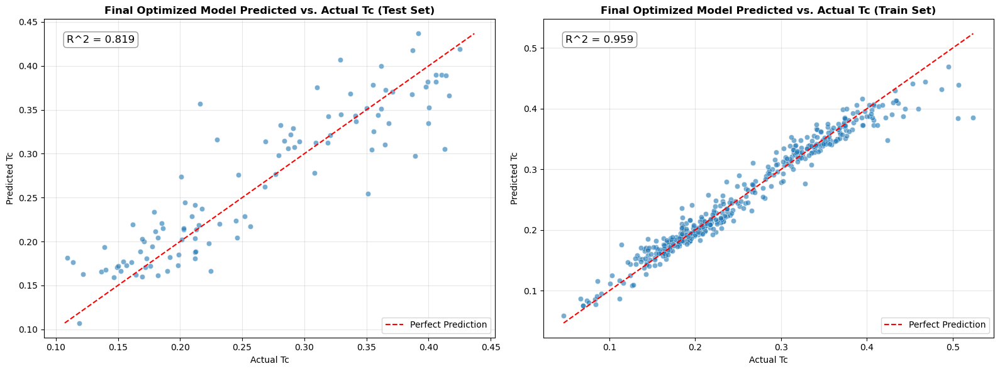

In [99]:
# Get predictions for the test set from the best model found by random_final_search
y_pred_test_final = best_model.predict(df_test[FEATURES_COLS])
y_true_test_final = df_test[TARGET_COLS] 

# Get predictions for the train set from the best model found by random_final_search
y_pred_train_final = best_model.predict(df_train[FEATURES_COLS])
y_true_train_final = df_train[TARGET_COLS] 

# Calculate R-squared scores for the final model
r2_test_final = r2_score(y_true_test_final, y_pred_test_final)
r2_train_final = r2_score(y_true_train_final, y_pred_train_final)

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6)) # 1 row, 2 columns

# Plot for Test Set
ax = axes[0]
sns.scatterplot(x=y_true_test_final, y=y_pred_test_final, alpha=0.6, ax=ax)
min_val_test = min(y_true_test_final.min(), y_pred_test_final.min())
max_val_test = max(y_true_test_final.max(), y_pred_test_final.max())
ax.plot([min_val_test, max_val_test], [min_val_test, max_val_test], color='red', linestyle='--', label='Perfect Prediction')
ax.text(0.05, 0.95, f'R^2 = {r2_test_final:.3f}', transform=ax.transAxes, fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round,pad=0.3', fc='white', ec='gray', lw=1, alpha=0.8))
ax.set_title('Final Optimized Model Predicted vs. Actual Tc (Test Set)', fontweight='bold')
ax.set_xlabel('Actual Tc')
ax.set_ylabel('Predicted Tc')
ax.grid(True, alpha=0.3)
ax.legend()

# Plot for Train Set
ax = axes[1]
sns.scatterplot(x=y_true_train_final, y=y_pred_train_final, alpha=0.6, ax=ax)
min_val_train = min(y_true_train_final.min(), y_pred_train_final.min())
max_val_train = max(y_true_train_final.max(), y_pred_train_final.max())
ax.plot([min_val_train, max_val_train], [min_val_train, max_val_train], color='red', linestyle='--', label='Perfect Prediction')
ax.text(0.05, 0.95, f'R^2 = {r2_train_final:.3f}', transform=ax.transAxes, fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round,pad=0.3', fc='white', ec='gray', lw=1, alpha=0.8))
ax.set_title('Final Optimized Model Predicted vs. Actual Tc (Train Set)', fontweight='bold')
ax.set_xlabel('Actual Tc')
ax.set_ylabel('Predicted Tc')
ax.grid(True, alpha=0.3)
ax.legend()

plt.tight_layout()
plt.show()

Applying Final Pipeline to NeurIPS challenge set

In [100]:
#apply final model to neurips challenge set
X_cc = cc_with_descriptors[list(FEATURES_COLS)]

y_true_cc = cc_with_descriptors[TARGET_COLS]

neurips_test = get_regression_metrics(best_model, X_cc, y_true_cc)

print("\nNeurIPS Challenge Set Regression Results:", neurips_test)


NeurIPS Challenge Set Regression Results: {'mae': 0.012774020197095245, 'mse': 0.0002205889971356214, 'max_error': 0.019704505614143386, 'mape': 0.0513397356500539}


Permutation Importance of Features

In [101]:
def get_perm_importance(model, X, y, features, n=10):
    """
    Calculate permutation importance score for each feature
    """
    # Calculate baseline score (without permuting any feature)
    baseline_score = model.score(X, y)

    importance_scores = {}

    # Loop over each feature
    for feature in features:
        X_perm = X.copy()
        sum_score = 0

        # Repeat n times to get average importance score
        for i in range(n):
            # Calculate score when given feature is permuted
            X_perm[feature] = np.random.permutation(X_perm[feature].values)
            permuted_score = baseline_score - model.score(X_perm, y)

            sum_score += permuted_score

        # Calculate decrease in score
        importance_score = sum_score / n

        # Store importance score
        importance_scores[feature] = importance_score

    return importance_scores

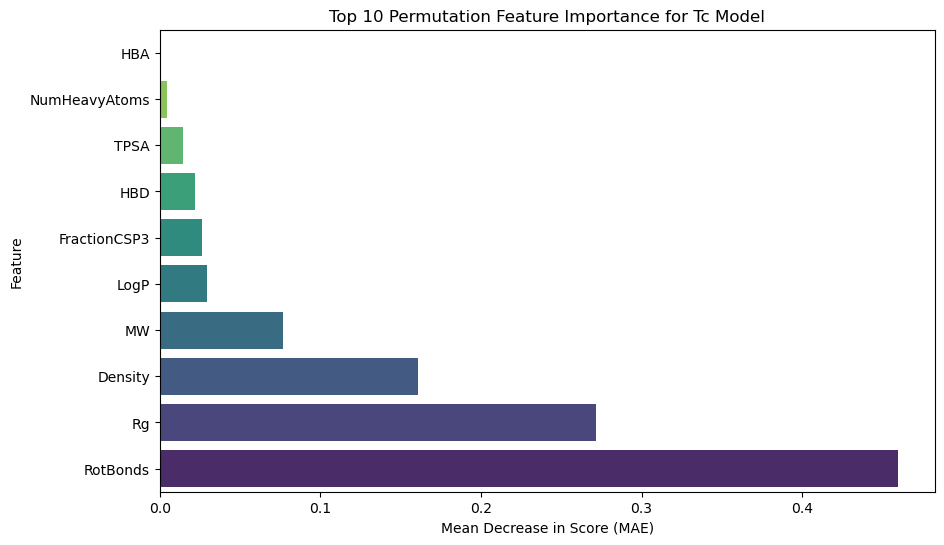

In [102]:
# Calculate permutation importance for best_model
hp_perm_importance = get_perm_importance(best_model, df_test[FEATURES_COLS], df_test[TARGET_COLS], df_test[FEATURES_COLS].columns.tolist())

# Sort and display top 10 best_model feature importance as a bar chart
sorted_hp_importance = sorted(hp_perm_importance.items(), key=lambda item: item[1], reverse=True)
top_10_hp_features = [item[0] for item in sorted_hp_importance[:10]]
top_10_hp_importance = [item[1] for item in sorted_hp_importance[:10]]

plt.figure(figsize=(10, 6))# Fit the search object to your training data
sns.barplot(x=top_10_hp_importance, y=top_10_hp_features, hue=top_10_hp_features, palette='viridis', legend=False)
plt.xlabel('Mean Decrease in Score (MAE)')
plt.ylabel('Feature')
plt.title('Top 10 Permutation Feature Importance for Tc Model')
plt.gca().invert_yaxis() # Invert y-axis to show the most important feature at the top
plt.show()

SHAP Analysis - Feature Contributions (FIX)

Uncertainty Analysis

Training 1000 ensemble models for uncertainty estimation...


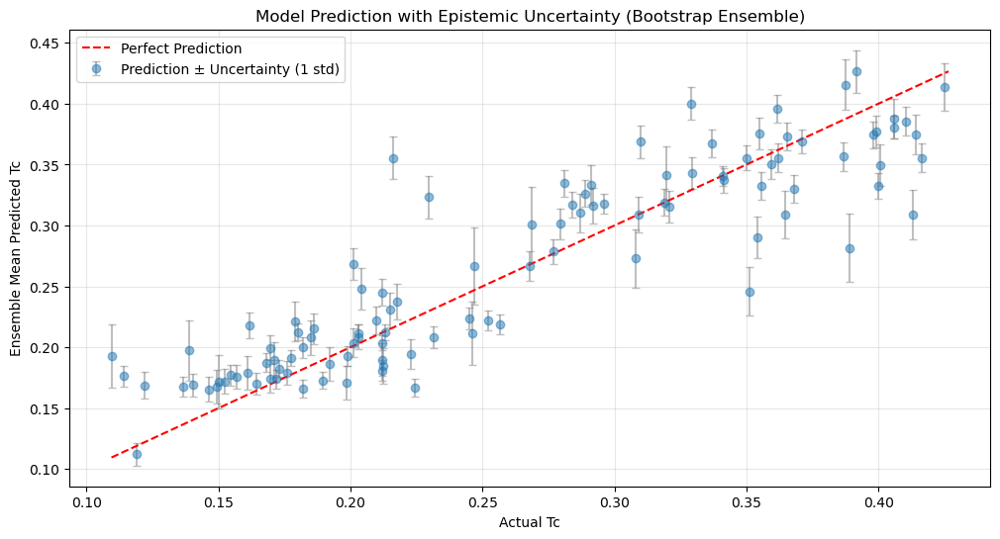

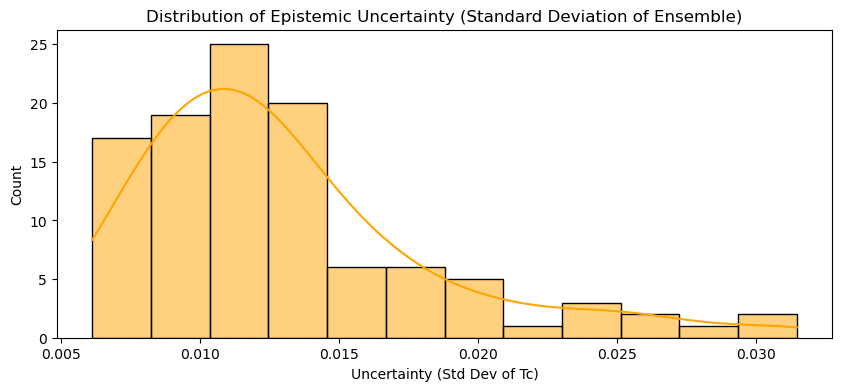

Average Uncertainty (Std Dev) across test set: 0.0130


In [103]:
from sklearn.base import clone
from sklearn.utils import resample

# Number of models in the ensemble
n_bootstraps = 1000
ensemble_preds = []

print(f"Training {n_bootstraps} ensemble models for uncertainty estimation...")

for i in range(n_bootstraps):
    # Create a bootstrap sample of the training data
    X_boot, y_boot = resample(df_train[FEATURES_COLS], df_train[TARGET_COLS], random_state=i)
    
    # Clone the best model configuration found earlier
    model_boot = clone(best_model)
    
    # Fit the model on the bootstrap sample
    model_boot.fit(X_boot, y_boot)
    
    # Predict on the test set
    preds = model_boot.predict(df_test[FEATURES_COLS])
    ensemble_preds.append(preds)

# Convert to numpy array for easy calculation
ensemble_preds = np.array(ensemble_preds)

# Calculate mean prediction and standard deviation (uncertainty)
y_pred_mean = np.mean(ensemble_preds, axis=0)
y_pred_std = np.std(ensemble_preds, axis=0) 

# Visualization 1: Actual vs Predicted with Error Bars
plt.figure(figsize=(12, 6))
plt.errorbar(df_test[TARGET_COLS], y_pred_mean, yerr=y_pred_std, fmt='o', ecolor='gray', alpha=0.5, capsize=3, label='Prediction ± Uncertainty (1 std)')


# Plot perfect prediction line
min_val = min(df_test[TARGET_COLS].min(), y_pred_mean.min())
max_val = max(df_test[TARGET_COLS].max(), y_pred_mean.max())
plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='Perfect Prediction')

plt.xlabel('Actual Tc')
plt.ylabel('Ensemble Mean Predicted Tc')
plt.title('Model Prediction with Epistemic Uncertainty (Bootstrap Ensemble)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Visualization 2: Distribution of Uncertainty
plt.figure(figsize=(10, 4))
sns.histplot(y_pred_std, kde=True, color='orange')
plt.title('Distribution of Epistemic Uncertainty (Standard Deviation of Ensemble)')
plt.xlabel('Uncertainty (Std Dev of Tc)')
plt.show()

print(f"Average Uncertainty (Std Dev) across test set: {np.mean(y_pred_std):.4f}")

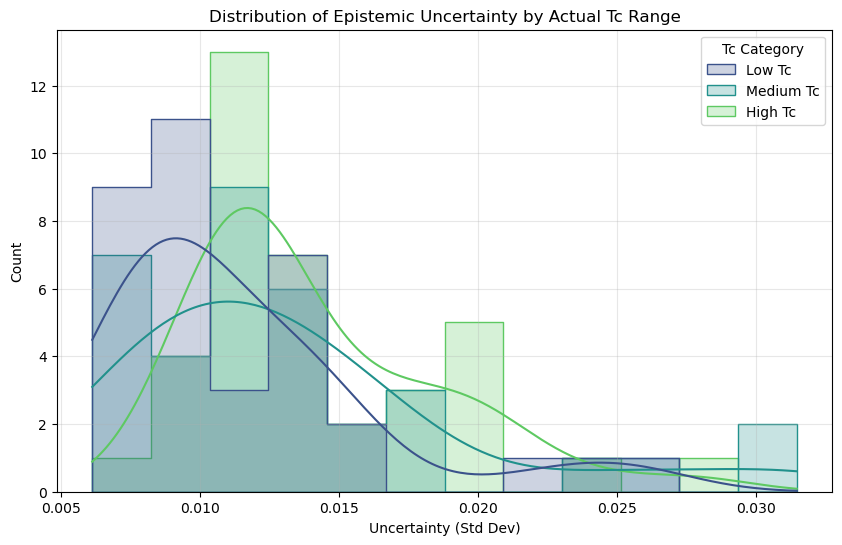

Average Uncertainty by Category:
Tc Category
High Tc      0.014163
Low Tc       0.011462
Medium Tc    0.013393
Name: Uncertainty, dtype: float32


In [107]:
# Define thresholds for Low, Medium, High based on quantiles
low_threshold = df_test[TARGET_COLS].quantile(0.33)
high_threshold = df_test[TARGET_COLS].quantile(0.66)

# Categorize the test data
conditions = [
    (df_test[TARGET_COLS] <= low_threshold),
    (df_test[TARGET_COLS] > low_threshold) & (df_test[TARGET_COLS] <= high_threshold),
    (df_test[TARGET_COLS] > high_threshold)
]
categories = ['Low Tc', 'Medium Tc', 'High Tc']
df_test['Tc_Category'] = np.select(conditions, categories, default='Unknown')

# Create a DataFrame for plotting
uncertainty_df = pd.DataFrame({
    'Uncertainty': y_pred_std,
    'Tc Category': df_test['Tc_Category']
})

# Plot the histograms
plt.figure(figsize=(10, 6))
sns.histplot(data=uncertainty_df, x='Uncertainty', hue='Tc Category', kde=True, element="step", palette='viridis')
plt.title('Distribution of Epistemic Uncertainty by Actual Tc Range')
plt.xlabel('Uncertainty (Std Dev)')
plt.ylabel('Count')
plt.grid(True, alpha=0.3)
plt.show()

# Print average uncertainty per category
print("Average Uncertainty by Category:")
print(uncertainty_df.groupby('Tc Category')['Uncertainty'].mean())

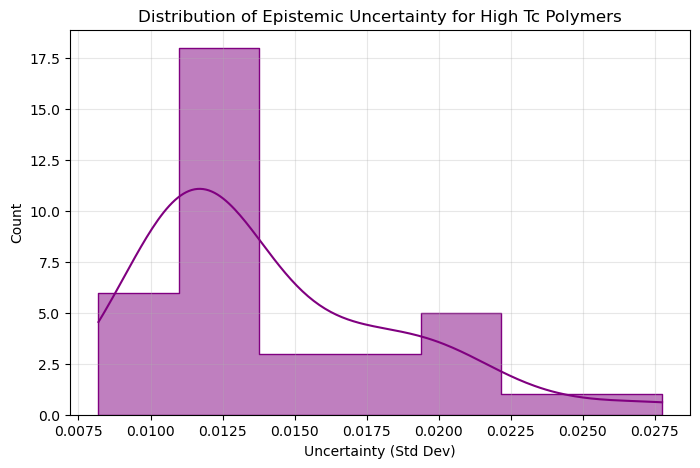

Average Uncertainty for High Tc: 0.0142


In [110]:
# Filter for High Tc category
high_tc_uncertainty = uncertainty_df[uncertainty_df['Tc Category'] == 'High Tc']

# Plot the histogram for High Tc
plt.figure(figsize=(8, 5))
sns.histplot(data=high_tc_uncertainty, x='Uncertainty', kde=True, color='purple', element="step")
plt.title('Distribution of Epistemic Uncertainty for High Tc Polymers')
plt.xlabel('Uncertainty (Std Dev)')
plt.ylabel('Count')
plt.grid(True, alpha=0.3)
plt.show()

print(f"Average Uncertainty for High Tc: {high_tc_uncertainty['Uncertainty'].mean():.4f}")

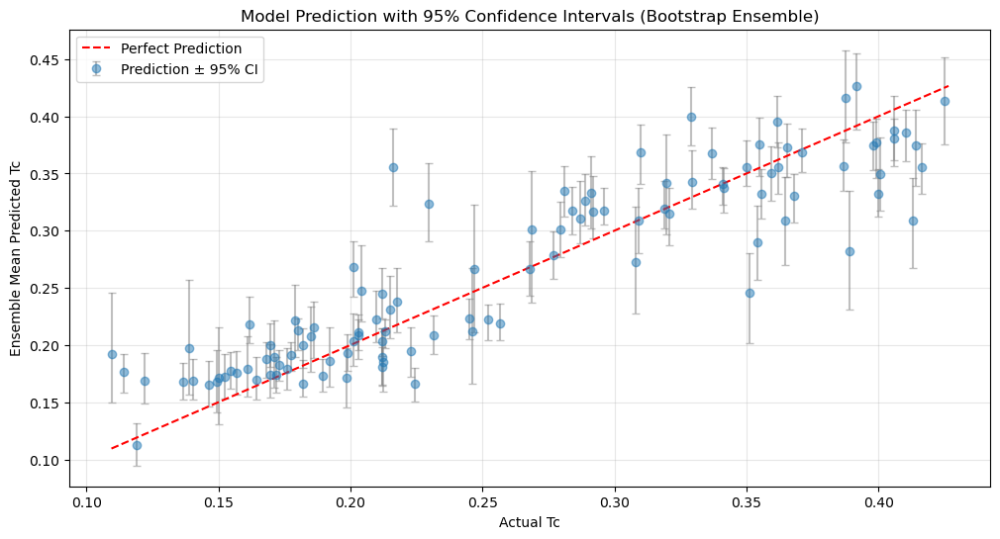

In [108]:
# Calculate 95% confidence intervals (2.5th and 97.5th percentiles)
lower_bound = np.percentile(ensemble_preds, 2.5, axis=0)
upper_bound = np.percentile(ensemble_preds, 97.5, axis=0)

# Calculate error bars (distance from mean to bounds)
yerr_lower = y_pred_mean - lower_bound
yerr_upper = upper_bound - y_pred_mean

# Visualization: Actual vs Predicted with 95% CI Error Bars
plt.figure(figsize=(12, 6))
plt.errorbar(df_test[TARGET_COLS], y_pred_mean, yerr=[yerr_lower, yerr_upper], fmt='o', ecolor='gray', alpha=0.5, capsize=3, label='Prediction ± 95% CI')

# Plot perfect prediction line
min_val = min(df_test[TARGET_COLS].min(), y_pred_mean.min())
max_val = max(df_test[TARGET_COLS].max(), y_pred_mean.max())
plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='Perfect Prediction')

plt.xlabel('Actual Tc')
plt.ylabel('Ensemble Mean Predicted Tc')
plt.title('Model Prediction with 95% Confidence Intervals (Bootstrap Ensemble)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

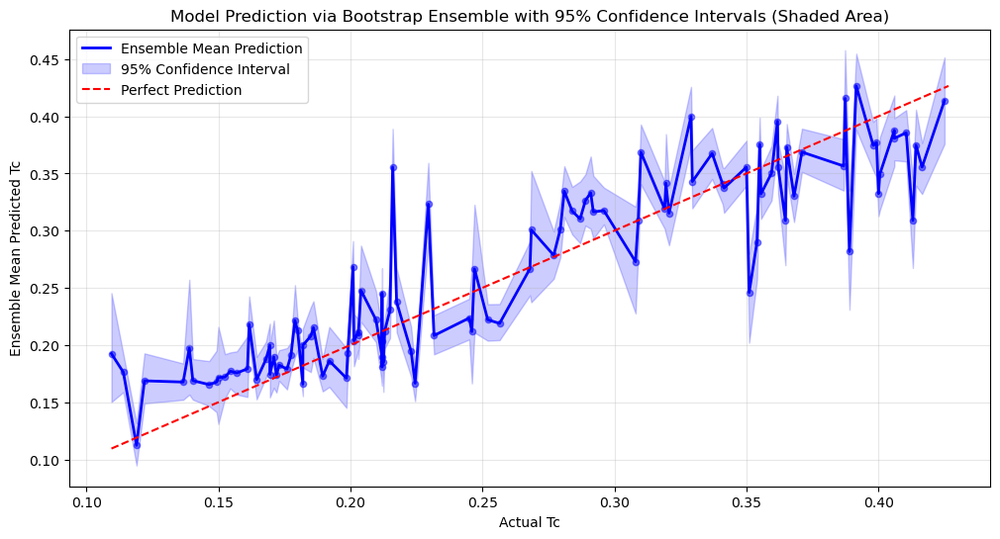

In [ ]:
# Sort the data by Actual Tc for continuous plotting of the shaded area
sort_idx = np.argsort(df_test[TARGET_COLS])
sorted_actual = df_test[TARGET_COLS].iloc[sort_idx]
sorted_pred_mean = y_pred_mean[sort_idx]
sorted_lower = lower_bound[sort_idx]
sorted_upper = upper_bound[sort_idx]

plt.figure(figsize=(12, 6))

# Plot the mean prediction line
plt.plot(sorted_actual, sorted_pred_mean, color='blue', label='Ensemble Mean Prediction', linewidth=2)

# Fill the area between the lower and upper bounds
plt.fill_between(sorted_actual, sorted_lower, sorted_upper, color='blue', alpha=0.2, label='95% Confidence Interval')

# Plot the perfect prediction line
min_val = min(sorted_actual.min(), sorted_pred_mean.min())
max_val = max(sorted_actual.max(), sorted_pred_mean.max())
plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='Perfect Prediction')

# Scatter plot of the actual data points for reference
plt.scatter(sorted_actual, sorted_pred_mean, color='blue', alpha=0.5, s=20)

plt.xlabel('Actual Tc')
plt.ylabel('Ensemble Mean Predicted Tc')
plt.title('Model Prediction via Bootstrap Ensemble with 95% Confidence Intervals (Shaded Area)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

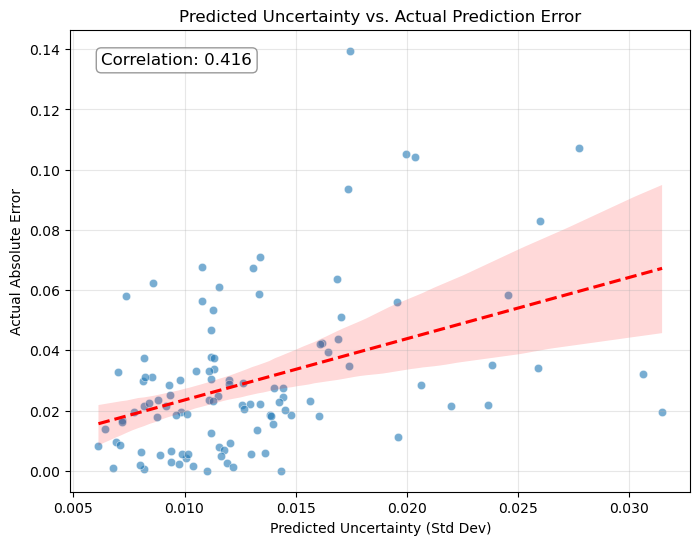

In [ ]:
# Calculate absolute errors
abs_errors = np.abs(df_test[TARGET_COLS] - y_pred_mean)

# Create the plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_pred_std, y=abs_errors, alpha=0.6)

# Add a trendline to see the correlation
sns.regplot(x=y_pred_std, y=abs_errors, scatter=False, color='red', line_kws={'linestyle':'--'})

plt.xlabel('Predicted Uncertainty (Std Dev)')
plt.ylabel('Actual Absolute Error')
plt.title('Predicted Uncertainty vs. Actual Prediction Error')
plt.grid(True, alpha=0.3)

# Calculate correlation coefficient
correlation = np.corrcoef(y_pred_std, abs_errors)[0, 1]
plt.text(0.05, 0.95, f'Correlation: {correlation:.3f}', transform=plt.gca().transAxes, 
         fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round,pad=0.3', fc='white', ec='gray', alpha=0.8))

plt.show()